# What's SMPL?

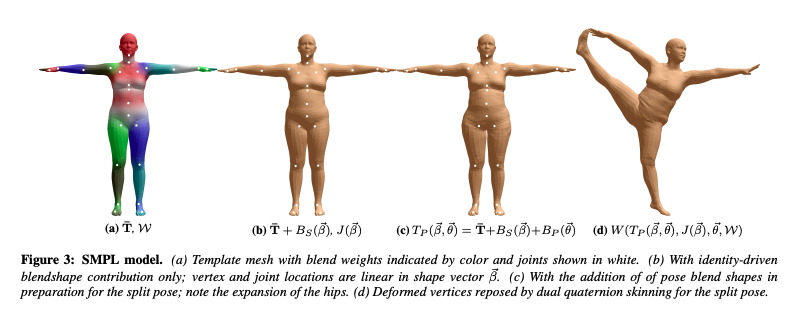

SMPL is a statistical template model of naked human body.
\
\
(train dataset)
- 1800 registrations (diverse pose) (40 people)
- 4300 registrations (diverse shape)

shape parameters : beta (generally 10-dim)\
pose-parameters : theta ((23+1)x3 dim)
  - 72-dim including global-orientation

## VIBE: Video Inference for Human Body Pose and Shape Estimation

Demo of the original PyTorch based implementation provided here: https://github.com/mkocabas/VIBE

## Note
Before running this notebook make sure that your runtime type is 'Python 3 with GPU acceleration'. Go to Edit > Notebook settings > Hardware Accelerator > Select "GPU".

## More Info
- Paper: https://arxiv.org/abs/1912.05656
- Repo: https://github.com/mkocabas/VIBE

In [ ]:
original_path = !pwd
original_path = original_path[0]

In [ ]:
# Clone the repo
!git clone https://github.com/mkocabas/VIBE.git

In [ ]:
%cd VIBE/

In [ ]:
!pip install git+https://github.com/giacaglia/pytube.git --upgrade

In [ ]:
!pip install git+https://github.com/mkocabas/yolov3-pytorch.git
!pip install git+https://github.com/mkocabas/multi-person-tracker.git
!pip install git+https://github.com/mattloper/chumpy.git
!pip install filterpy progress smplx yacs llvmlite h5py trimesh pyrender

In [ ]:
# Download pretrained weights and SMPL data
!source scripts/prepare_data.sh

### Run the demo code.

Check https://github.com/mkocabas/VIBE/blob/master/doc/demo.md for more details about demo.

**Note:** Final rendering is slow compared to inference. We use pyrender with GPU accelaration and it takes 2-3 FPS per image. Please let us know if you know any faster alternative.

In [ ]:
import importlib
numpy = importlib.import_module('numpy')
numpy.float = numpy.float32
numpy.int = numpy.int32
numpy.bool = numpy.bool_
numpy.unicode = numpy.unicode_
numpy.complex = numpy.complex_
numpy.object = numpy.object_
numpy.str = numpy.dtype.str


import os
os.environ['PYOPENGL_PLATFORM'] = 'egl'

import cv2
import time
import torch
import joblib
import shutil
import colorsys
import argparse
import numpy as np
from tqdm import tqdm
from multi_person_tracker import MPT
from torch.utils.data import DataLoader

from lib.models.vibe import VIBE_Demo
from lib.utils.renderer import Renderer
from lib.dataset.inference import Inference
from lib.utils.smooth_pose import smooth_pose
from lib.data_utils.kp_utils import convert_kps
from lib.utils.pose_tracker import run_posetracker

from lib.utils.demo_utils import (
    # download_youtube_clip,
    smplify_runner,
    convert_crop_coords_to_orig_img,
    convert_crop_cam_to_orig_img,
    prepare_rendering_results,
    video_to_images,
    images_to_video,
    download_ckpt,
)

MIN_NUM_FRAMES = 10


from pytube import YouTube
def download_youtube_clip(url, download_folder):
    return YouTube(url).streams.first().download(output_path=download_folder)


def main(args):
    device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

    video_file = args.vid_file

    # ========= [Optional] download the youtube video ========= #
    if video_file.startswith('https://www.youtube.com'):
        print(f'Donwloading YouTube video \"{video_file}\"')
        video_file = download_youtube_clip(video_file, '/tmp')

        if video_file is None:
            exit('Youtube url is not valid!')

        print(f'YouTube Video has been downloaded to {video_file}...')

    if not os.path.isfile(video_file):
        exit(f'Input video \"{video_file}\" does not exist!')

    output_path = os.path.join(args.output_folder, os.path.basename(video_file).replace('.mp4', ''))
    os.makedirs(output_path, exist_ok=True)

    image_folder, num_frames, img_shape = video_to_images(video_file, return_info=True)

    print(f'Input video number of frames {num_frames}')
    orig_height, orig_width = img_shape[:2]

    total_time = time.time()

    # ========= Run tracking ========= #
    bbox_scale = 1.1
    if args.tracking_method == 'pose':
        if not os.path.isabs(video_file):
            video_file = os.path.join(os.getcwd(), video_file)
        tracking_results = run_posetracker(video_file, staf_folder=args.staf_dir, display=args.display)
    else:
        # run multi object tracker
        mot = MPT(
            device=device,
            batch_size=args.tracker_batch_size,
            display=args.display,
            detector_type=args.detector,
            output_format='dict',
            yolo_img_size=args.yolo_img_size,
        )
        tracking_results = mot(image_folder)

    # remove tracklets if num_frames is less than MIN_NUM_FRAMES
    for person_id in list(tracking_results.keys()):
        if tracking_results[person_id]['frames'].shape[0] < MIN_NUM_FRAMES:
            del tracking_results[person_id]

    # ========= Define VIBE model ========= #
    model = VIBE_Demo(
        seqlen=16,
        n_layers=2,
        hidden_size=1024,
        add_linear=True,
        use_residual=True,
    ).to(device)

    # ========= Load pretrained weights ========= #
    pretrained_file = download_ckpt(use_3dpw=False)
    ckpt = torch.load(pretrained_file)
    print(f'Performance of pretrained model on 3DPW: {ckpt["performance"]}')
    ckpt = ckpt['gen_state_dict']
    model.load_state_dict(ckpt, strict=False)
    model.eval()
    print(f'Loaded pretrained weights from \"{pretrained_file}\"')

    # ========= Run VIBE on each person ========= #
    print(f'Running VIBE on each tracklet...')
    vibe_time = time.time()
    vibe_results = {}
    for person_id in tqdm(list(tracking_results.keys())):
        bboxes = joints2d = None

        if args.tracking_method == 'bbox':
            bboxes = tracking_results[person_id]['bbox']
        elif args.tracking_method == 'pose':
            joints2d = tracking_results[person_id]['joints2d']

        frames = tracking_results[person_id]['frames']

        dataset = Inference(
            image_folder=image_folder,
            frames=frames,
            bboxes=bboxes,
            joints2d=joints2d,
            scale=bbox_scale,
        )

        bboxes = dataset.bboxes
        frames = dataset.frames
        has_keypoints = True if joints2d is not None else False

        dataloader = DataLoader(dataset, batch_size=args.vibe_batch_size, num_workers=16)

        with torch.no_grad():

            pred_cam, pred_verts, pred_pose, pred_betas, pred_joints3d, smpl_joints2d, norm_joints2d = [], [], [], [], [], [], []

            for batch in dataloader:
                if has_keypoints:
                    batch, nj2d = batch
                    norm_joints2d.append(nj2d.numpy().reshape(-1, 21, 3))

                batch = batch.unsqueeze(0)
                batch = batch.to(device)

                batch_size, seqlen = batch.shape[:2]
                output = model(batch)[-1]

                pred_cam.append(output['theta'][:, :, :3].reshape(batch_size * seqlen, -1))
                pred_verts.append(output['verts'].reshape(batch_size * seqlen, -1, 3))
                pred_pose.append(output['theta'][:,:,3:75].reshape(batch_size * seqlen, -1))
                pred_betas.append(output['theta'][:, :,75:].reshape(batch_size * seqlen, -1))
                pred_joints3d.append(output['kp_3d'].reshape(batch_size * seqlen, -1, 3))
                smpl_joints2d.append(output['kp_2d'].reshape(batch_size * seqlen, -1, 2))


            pred_cam = torch.cat(pred_cam, dim=0)
            pred_verts = torch.cat(pred_verts, dim=0)
            pred_pose = torch.cat(pred_pose, dim=0)
            pred_betas = torch.cat(pred_betas, dim=0)
            pred_joints3d = torch.cat(pred_joints3d, dim=0)
            smpl_joints2d = torch.cat(smpl_joints2d, dim=0)
            del batch

        # ========= [Optional] run Temporal SMPLify to refine the results ========= #
        if args.run_smplify and args.tracking_method == 'pose':
            norm_joints2d = np.concatenate(norm_joints2d, axis=0)
            norm_joints2d = convert_kps(norm_joints2d, src='staf', dst='spin')
            norm_joints2d = torch.from_numpy(norm_joints2d).float().to(device)

            # Run Temporal SMPLify
            update, new_opt_vertices, new_opt_cam, new_opt_pose, new_opt_betas, \
            new_opt_joints3d, new_opt_joint_loss, opt_joint_loss = smplify_runner(
                pred_rotmat=pred_pose,
                pred_betas=pred_betas,
                pred_cam=pred_cam,
                j2d=norm_joints2d,
                device=device,
                batch_size=norm_joints2d.shape[0],
                pose2aa=False,
            )

            # update the parameters after refinement
            print(f'Update ratio after Temporal SMPLify: {update.sum()} / {norm_joints2d.shape[0]}')
            pred_verts = pred_verts.cpu()
            pred_cam = pred_cam.cpu()
            pred_pose = pred_pose.cpu()
            pred_betas = pred_betas.cpu()
            pred_joints3d = pred_joints3d.cpu()
            pred_verts[update] = new_opt_vertices[update]
            pred_cam[update] = new_opt_cam[update]
            pred_pose[update] = new_opt_pose[update]
            pred_betas[update] = new_opt_betas[update]
            pred_joints3d[update] = new_opt_joints3d[update]

        elif args.run_smplify and args.tracking_method == 'bbox':
            print('[WARNING] You need to enable pose tracking to run Temporal SMPLify algorithm!')
            print('[WARNING] Continuing without running Temporal SMPLify!..')

        # ========= Save results to a pickle file ========= #
        pred_cam = pred_cam.cpu().numpy()
        pred_verts = pred_verts.cpu().numpy()
        pred_pose = pred_pose.cpu().numpy()
        pred_betas = pred_betas.cpu().numpy()
        pred_joints3d = pred_joints3d.cpu().numpy()
        smpl_joints2d = smpl_joints2d.cpu().numpy()

        # Runs 1 Euro Filter to smooth out the results
        if args.smooth:
            min_cutoff = args.smooth_min_cutoff # 0.004
            beta = args.smooth_beta # 1.5
            print(f'Running smoothing on person {person_id}, min_cutoff: {min_cutoff}, beta: {beta}')
            pred_verts, pred_pose, pred_joints3d = smooth_pose(pred_pose, pred_betas,
                                                               min_cutoff=min_cutoff, beta=beta)

        orig_cam = convert_crop_cam_to_orig_img(
            cam=pred_cam,
            bbox=bboxes,
            img_width=orig_width,
            img_height=orig_height
        )

        joints2d_img_coord = convert_crop_coords_to_orig_img(
            bbox=bboxes,
            keypoints=smpl_joints2d,
            crop_size=224,
        )

        output_dict = {
            'pred_cam': pred_cam,
            'orig_cam': orig_cam,
            'verts': pred_verts,
            'pose': pred_pose,
            'betas': pred_betas,
            'joints3d': pred_joints3d,
            'joints2d': joints2d,
            'joints2d_img_coord': joints2d_img_coord,
            'bboxes': bboxes,
            'frame_ids': frames,
        }

        vibe_results[person_id] = output_dict

    del model

    end = time.time()
    fps = num_frames / (end - vibe_time)

    print(f'VIBE FPS: {fps:.2f}')
    total_time = time.time() - total_time
    print(f'Total time spent: {total_time:.2f} seconds (including model loading time).')
    print(f'Total FPS (including model loading time): {num_frames / total_time:.2f}.')

    print(f'Saving output results to \"{os.path.join(output_path, "vibe_output.pkl")}\".')

    joblib.dump(vibe_results, os.path.join(output_path, "vibe_output.pkl"))

    if not args.no_render:
        # ========= Render results as a single video ========= #
        renderer = Renderer(resolution=(orig_width, orig_height), orig_img=True, wireframe=args.wireframe)

        output_img_folder = f'{image_folder}_output'
        os.makedirs(output_img_folder, exist_ok=True)

        print(f'Rendering output video, writing frames to {output_img_folder}')

        # prepare results for rendering
        frame_results = prepare_rendering_results(vibe_results, num_frames)
        mesh_color = {k: colorsys.hsv_to_rgb(np.random.rand(), 0.5, 1.0) for k in vibe_results.keys()}

        image_file_names = sorted([
            os.path.join(image_folder, x)
            for x in os.listdir(image_folder)
            if x.endswith('.png') or x.endswith('.jpg')
        ])

        for frame_idx in tqdm(range(len(image_file_names))):
            img_fname = image_file_names[frame_idx]
            img = cv2.imread(img_fname)

            if args.sideview:
                side_img = np.zeros_like(img)

            for person_id, person_data in frame_results[frame_idx].items():
                frame_verts = person_data['verts']
                frame_cam = person_data['cam']

                mc = mesh_color[person_id]

                mesh_filename = None

                if args.save_obj:
                    mesh_folder = os.path.join(output_path, 'meshes', f'{person_id:04d}')
                    os.makedirs(mesh_folder, exist_ok=True)
                    mesh_filename = os.path.join(mesh_folder, f'{frame_idx:06d}.obj')

                img = renderer.render(
                    img,
                    frame_verts,
                    cam=frame_cam,
                    color=mc,
                    mesh_filename=mesh_filename,
                )

                if args.sideview:
                    side_img = renderer.render(
                        side_img,
                        frame_verts,
                        cam=frame_cam,
                        color=mc,
                        angle=270,
                        axis=[0,1,0],
                    )

            if args.sideview:
                img = np.concatenate([img, side_img], axis=1)

            cv2.imwrite(os.path.join(output_img_folder, f'{frame_idx:06d}.png'), img)

            if args.display:
                cv2.imshow('Video', img)
                if cv2.waitKey(1) & 0xFF == ord('q'):
                    break

        if args.display:
            cv2.destroyAllWindows()

        # ========= Save rendered video ========= #
        vid_name = os.path.basename(video_file)
        save_name = f'{vid_name.replace(".mp4", "")}_vibe_result.mp4'
        save_name = os.path.join(output_path, save_name)
        print(f'Saving result video to {save_name}')
        images_to_video(img_folder=output_img_folder, output_vid_file=save_name)
        shutil.rmtree(output_img_folder)

    shutil.rmtree(image_folder)
    print('================= END =================')

def get_args():
    parser = argparse.ArgumentParser()

    parser.add_argument('--vid_file', type=str,
                        help='input video path or youtube link')

    parser.add_argument('--output_folder', type=str,
                        help='output folder to write results')

    parser.add_argument('--tracking_method', type=str, default='bbox', choices=['bbox', 'pose'],
                        help='tracking method to calculate the tracklet of a subject from the input video')

    parser.add_argument('--detector', type=str, default='yolo', choices=['yolo', 'maskrcnn'],
                        help='object detector to be used for bbox tracking')

    parser.add_argument('--yolo_img_size', type=int, default=416,
                        help='input image size for yolo detector')

    parser.add_argument('--tracker_batch_size', type=int, default=12,
                        help='batch size of object detector used for bbox tracking')

    parser.add_argument('--staf_dir', type=str, default='/home/mkocabas/developments/openposetrack',
                        help='path to directory STAF pose tracking method installed.')

    parser.add_argument('--vibe_batch_size', type=int, default=450,
                        help='batch size of VIBE')

    parser.add_argument('--display', action='store_true',
                        help='visualize the results of each step during demo')

    parser.add_argument('--run_smplify', action='store_true',
                        help='run smplify for refining the results, you need pose tracking to enable it')

    parser.add_argument('--no_render', action='store_true',
                        help='disable final rendering of output video.')

    parser.add_argument('--wireframe', action='store_true',
                        help='render all meshes as wireframes.')

    parser.add_argument('--sideview', action='store_true',
                        help='render meshes from alternate viewpoint.')

    parser.add_argument('--save_obj', action='store_true',
                        help='save results as .obj files.')

    parser.add_argument('--smooth', action='store_true',
                        help='smooth the results to prevent jitter')

    parser.add_argument('--smooth_min_cutoff', type=float, default=0.004,
                        help='one euro filter min cutoff. '
                             'Decreasing the minimum cutoff frequency decreases slow speed jitter')

    parser.add_argument('--smooth_beta', type=float, default=0.7,
                        help='one euro filter beta. '
                             'Increasing the speed coefficient(beta) decreases speed lag.')

    args = parser.parse_args([])    # use empty argument instead of system input
    return args




In [ ]:
args = get_args()

args.__setattr__('sideview', True)
args.__setattr__('vid_file', 'sample_video.mp4')
args.__setattr__('output_folder', 'output/')

main(args)

In [ ]:
# Play the generated video
from IPython.display import HTML
from base64 import b64encode

def video(path):
  mp4 = open(path,'rb').read()
  data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
  return HTML('<video width=500 controls loop> <source src="%s" type="video/mp4"></video>' % data_url)

!ffmpeg -framerate 6 -pattern_type glob -i '*.png'  -c:v libx264   -vf "pad=ceil(iw/2)*2:ceil(ih/2)*2" -pix_fmt yuv420p video.mp4
video('output/sample_video/sample_video_vibe_result.mp4')

In [ ]:
# Inspect the output file content
import joblib
output = joblib.load('output/sample_video/vibe_output.pkl')
print('Track ids:', output.keys(), end='\n\n')

print('VIBE output file content:', end='\n\n')
for k,v in output[1].items():
  if k != 'joints2d':
    print(k, v.shape)

Test with random video.

In [ ]:
# !python -m pip install -U pytube
!python3 -m pip install -U "yt-dlp[default]"
!curl -L https://github.com/yt-dlp/yt-dlp/raw/master/public.key | gpg --import
!gpg --verify SHA2-256SUMS.sig SHA2-256SUMS
!gpg --verify SHA2-512SUMS.sig SHA2-512SUMS

Run VIBE demo


In [ ]:
!yt-dlp -U
!yt-dlp https://www.youtube.com/watch?v=2mYGh268vmA

In [ ]:
args = get_args()
args.__setattr__('sideview', True)
args.__setattr__('vid_file', original_path+"/VIBE/NewJeans (뉴진스) 'Ditto' Dance Clip [2mYGh268vmA].webm")
# args.__setattr__('vid_file', 'https://www.youtube.com/zzwWzLY7kEo?si=JLfmPoQbcmQtEUIc')

args.__setattr__('output_folder', 'output/')

In [ ]:
main(args)
video(original_path+'/content/VIBE/output/Ditto.3gpp/Ditto.3gpp_vibe_result.mp4')

In [19]:
%cd ..

/home/devrok/aiexpert/ai-vision/3D_Reconstruction


Sideview plots the side-view of SMPL mesh without considering global depth

# SMPL fitting on 2D keypoint


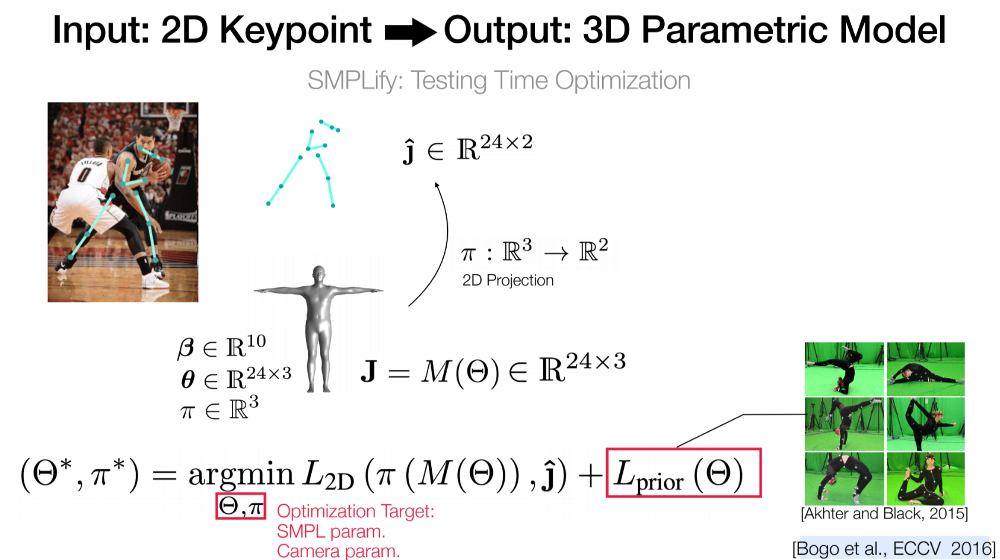

Let's download sample datas & required datasets

In [27]:
!unzip smpldata/images.zip -d ./smpldata
!tar -zxvf smpldata/spin.tar.gz -C ./smpldata

Archive:  smpldata/images.zip
   creating: ./smpldata/images/
  inflating: ./smpldata/images/000143.png  
  inflating: ./smpldata/images/000165.png  
  inflating: ./smpldata/images/000167.png  
  inflating: ./smpldata/images/000053.png  
  inflating: ./smpldata/images/000102.png  
  inflating: ./smpldata/images/000133.png  
  inflating: ./smpldata/images/000006.png  
  inflating: ./smpldata/images/000108.png  
  inflating: ./smpldata/images/000197.png  
  inflating: ./smpldata/images/000135.png  
  inflating: ./smpldata/images/000104.png  
  inflating: ./smpldata/images/000029.png  
  inflating: ./smpldata/images/000153.png  
  inflating: ./smpldata/images/000012.png  
  inflating: ./smpldata/images/000076.png  
  inflating: ./smpldata/images/000061.png  
  inflating: ./smpldata/images/000155.png  
  inflating: ./smpldata/images/000046.png  
  inflating: ./smpldata/images/000181.png  
  inflating: ./smpldata/images/000101.png  
  inflating: ./smpldata/images/000111.png  
  inflating: .

In [48]:
IMG_DIR=original_path+"/smpldata/images"
SMPL_DIR=original_path+"/VIBE/data/vibe_data"

### Install required packages to run demo

In [81]:
!pip install --upgrade simple-romp
!pip install smplx trimesh
!pip install chumpy

import os
import sys
import torch
pyt_version_str=torch.__version__.split("+")[0].replace(".", "")
version_str="".join([
    f"py3{sys.version_info.minor}_cu",
    torch.version.cuda.replace(".",""),
    f"_pyt{pyt_version_str}"
])
!pip install fvcore iopath
!pip install --no-index --no-cache-dir pytorch3d -f https://dl.fbaipublicfiles.com/pytorch3d/packaging/wheels/{version_str}/download.html

  Using cached simple_romp-2.0.1.tar.gz (286 kB)
  Preparing metadata (setup.py) ... done
Discarding https://files.pythonhosted.org/packages/fe/82/ee0e6e9f8bdc1a42adb9344cd542e11cdd66ba091a895dd202c516bbfb4e/simple_romp-2.0.1.tar.gz (from https://pypi.org/simple/simple-romp/): Requested simple-romp from https://files.pythonhosted.org/packages/fe/82/ee0e6e9f8bdc1a42adb9344cd542e11cdd66ba091a895dd202c516bbfb4e/simple_romp-2.0.1.tar.gz has inconsistent version: expected '2.0.1', but metadata has '1.1.2'
Looking in links: https://dl.fbaipublicfiles.com/pytorch3d/packaging/wheels/py310_cu121_pyt231/download.html


### plot images to process

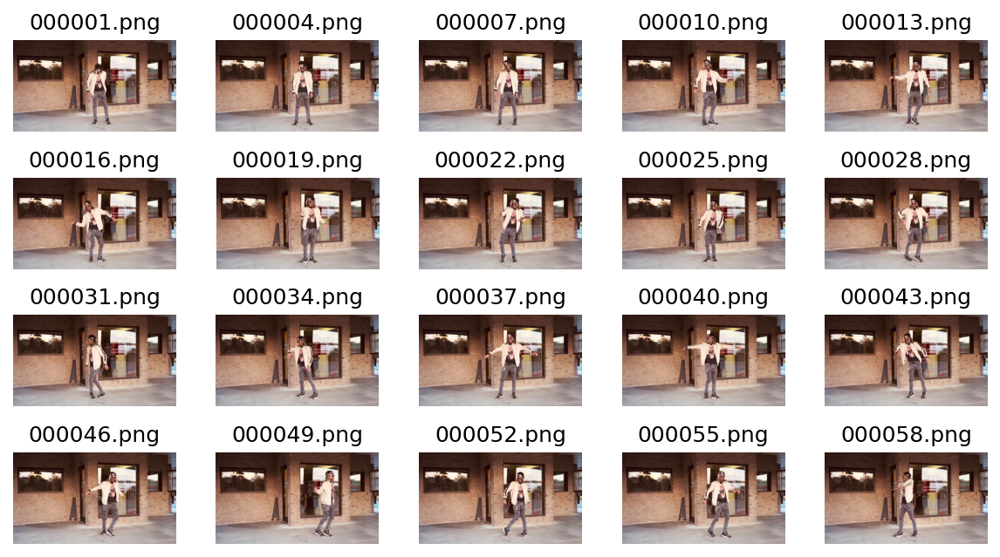

In [50]:
# plot images to process
# Here we selects first 20 frames, every 3 second
import matplotlib.pyplot as plt
import cv2
import numpy as np
from pathlib import Path

img_fnames = sorted(list(Path(IMG_DIR).glob("*.png")))


plt.figure(figsize=(10,5), dpi=150)
img_cnt = 0
target_names = []
for i, img_fname in enumerate(img_fnames):
    if i % 3 != 0:
      continue
    if img_cnt >= 20:
      break
    I = cv2.imread(str(img_fname))

    plt.subplot(4,5,img_cnt+1)
    plt.imshow(I[...,[2,1,0]])
    plt.axis('off')
    plt.title(img_fname.name)
    img_cnt += 1
    target_names.append(img_fname)
plt.subplots_adjust(wspace=0, hspace=0.5)
img_fnames = target_names

Let's extract 2D keypoints from given images!

In [31]:
!git clone https://github.com/Daniil-Osokin/lightweight-human-pose-estimation.pytorch.git

fatal: destination path 'lightweight-human-pose-estimation.pytorch' already exists and is not an empty directory.


In [54]:
%cd ./lightweight-human-pose-estimation.pytorch/

/home/devrok/aiexpert/ai-vision/3D_Reconstruction/lightweight-human-pose-estimation.pytorch


In [37]:
!wget https://download.01.org/opencv/openvino_training_extensions/models/human_pose_estimation/checkpoint_iter_370000.pth

--2024-08-09 17:04:08--  https://download.01.org/opencv/openvino_training_extensions/models/human_pose_estimation/checkpoint_iter_370000.pth
Resolving download.01.org (download.01.org)... 23.6.181.13, 2600:1410:4000:192::a87, 2600:1410:4000:18d::a87
Connecting to download.01.org (download.01.org)|23.6.181.13|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 87959810 (84M) [application/octet-stream]
Saving to: ‘checkpoint_iter_370000.pth.9’

checkpoint_iter_370 100%[===================>]  83.88M  17.9MB/s    in 6.0s    

2024-08-09 17:04:15 (14.0 MB/s) - ‘checkpoint_iter_370000.pth.9’ saved [87959810/87959810]



In [51]:
import torch
import cv2
import numpy as np
from models.with_mobilenet import PoseEstimationWithMobileNet
from modules.keypoints import extract_keypoints, group_keypoints
from modules.load_state import load_state
from modules.pose import Pose, track_poses
from tqdm import tqdm
import demo


def get_2d_kpts(net, images):
    net = net.eval()

    stride = 8
    upsample_ratio = 4
    height= 512
    num_keypoints = Pose.num_kpts
    poses = []
    delay = 33

    plt.figure(figsize=(10,5), dpi=150)
    for _id, image in tqdm(enumerate(images)):
        img = cv2.imread(str(image), cv2.IMREAD_COLOR)
        orig_img = img.copy()
        orig_img = img.copy()
        heatmaps, pafs, scale, pad = demo.infer_fast(net, img, height, stride, upsample_ratio, cpu=False)


        total_keypoints_num = 0
        all_keypoints_by_type = []
        for kpt_idx in range(num_keypoints):  # 19th for bg
            total_keypoints_num += extract_keypoints(heatmaps[:, :, kpt_idx], all_keypoints_by_type, total_keypoints_num)

        pose_entries, all_keypoints = group_keypoints(all_keypoints_by_type, pafs)
        for kpt_id in range(all_keypoints.shape[0]):
            all_keypoints[kpt_id, 0] = (all_keypoints[kpt_id, 0] * stride / upsample_ratio - pad[1]) / scale
            all_keypoints[kpt_id, 1] = (all_keypoints[kpt_id, 1] * stride / upsample_ratio - pad[0]) / scale
        current_poses = []
        max_pose = None
        max_pose_size = -1
        for n in range(len(pose_entries)):
            if len(pose_entries[n]) == 0:
                print("skip")
                continue
            pose_keypoints = np.ones((num_keypoints, 2), dtype=np.int32) * -1
            updated_xs = []
            updated_ys = []
            for kpt_id in range(num_keypoints):
                if pose_entries[n][kpt_id] != -1.0:  # keypoint was found
                    pose_keypoints[kpt_id, 0] = int(all_keypoints[int(pose_entries[n][kpt_id]), 0])
                    pose_keypoints[kpt_id, 1] = int(all_keypoints[int(pose_entries[n][kpt_id]), 1])
                    updated_xs.append(pose_keypoints[kpt_id, 0])
                    updated_ys.append(pose_keypoints[kpt_id, 1])
            pose = Pose(pose_keypoints, pose_entries[n][18])
            current_poses.append(pose)

            # pose size
            updated_xs = np.array(updated_xs)
            updated_ys = np.array(updated_ys)
            pose_size = (updated_xs.max() - updated_xs.min()) * (updated_ys.max() - updated_ys.min())

            if pose_size > max_pose_size:
                max_pose_size = pose_size
                max_pose = pose


        max_pose.draw(img)
        plt.imshow(img[...,[2,1,0]])
        plt.axis('off')
        plt.title(image.name)
        plt.show()

        poses.append(max_pose)

    plt.subplots_adjust(wspace=0, hspace=0.5)
    return poses


0it [00:00, ?it/s]

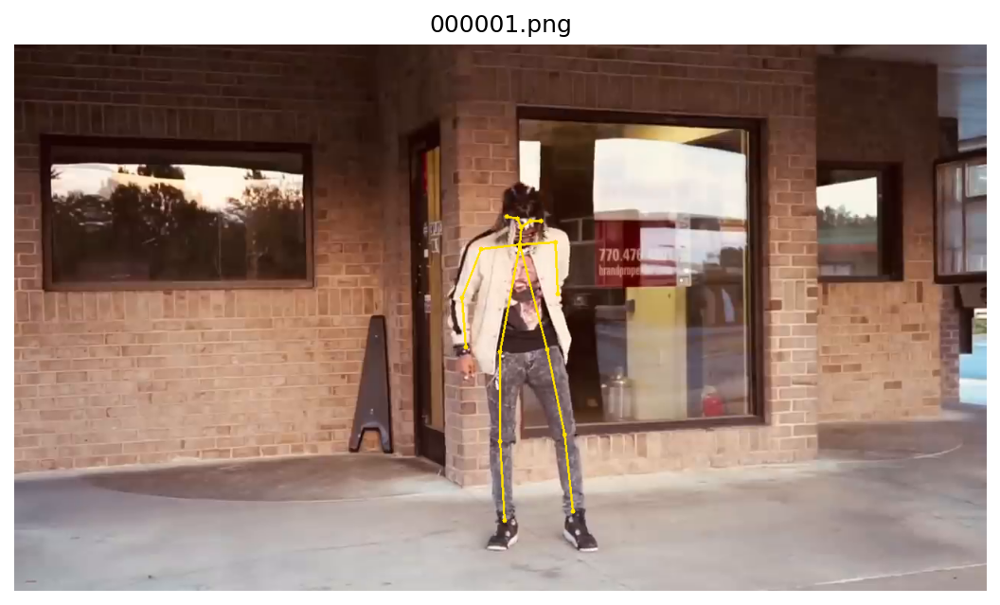

1it [00:00,  2.85it/s]

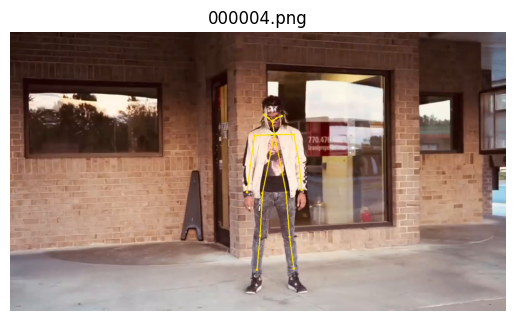

2it [00:00,  3.50it/s]

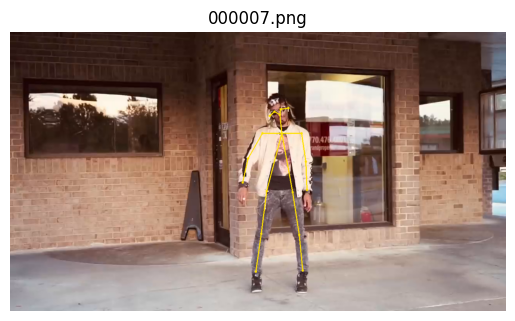

3it [00:00,  3.89it/s]

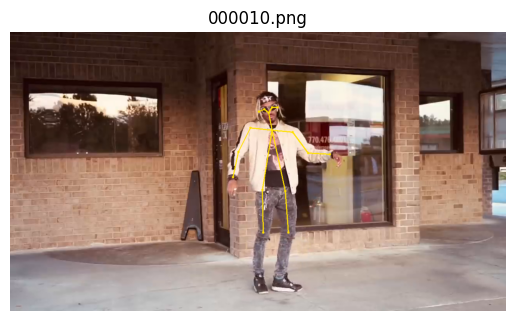

4it [00:01,  4.11it/s]

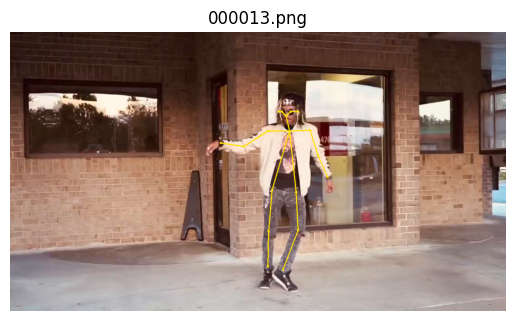

5it [00:01,  4.22it/s]

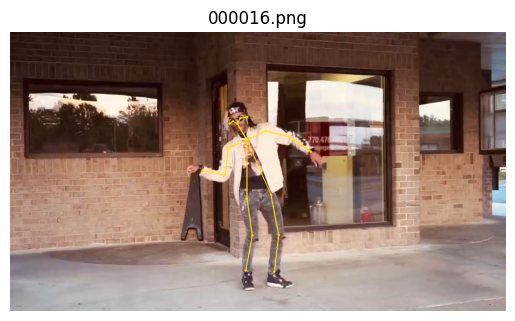

6it [00:01,  4.31it/s]

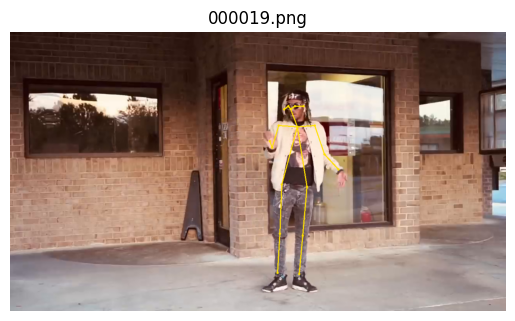

7it [00:01,  4.41it/s]

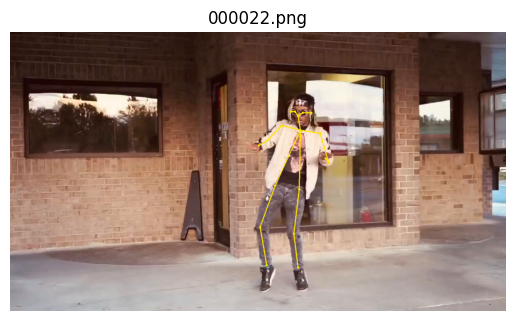

8it [00:01,  4.43it/s]

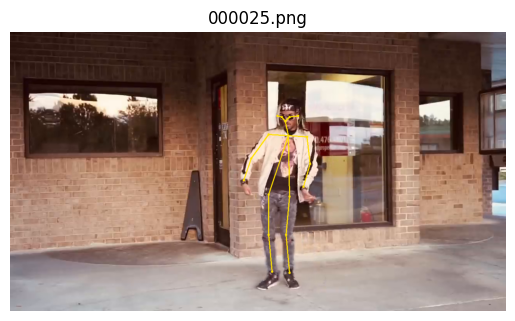

9it [00:02,  4.43it/s]

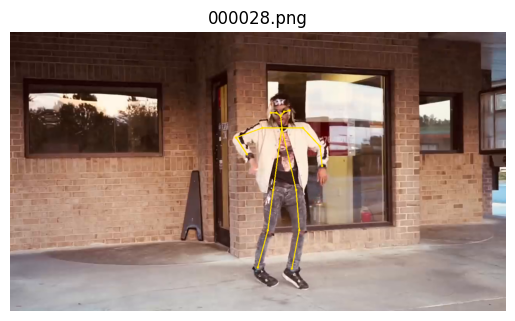

10it [00:02,  4.47it/s]

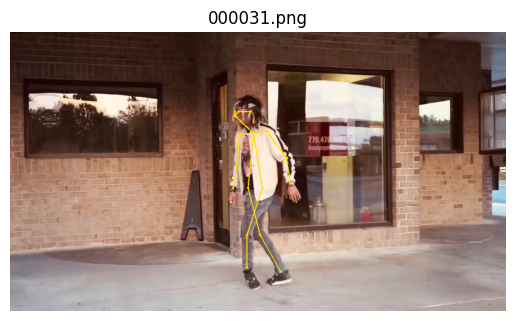

11it [00:02,  4.51it/s]

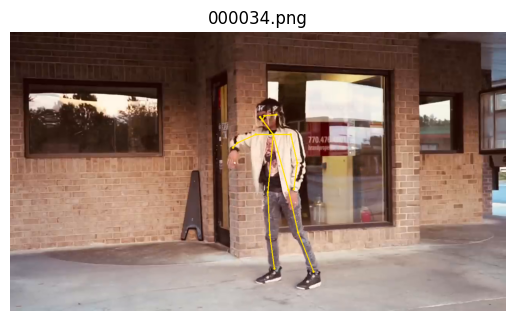

12it [00:02,  4.49it/s]

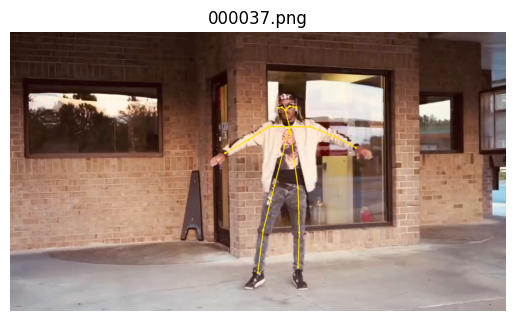

13it [00:03,  4.51it/s]

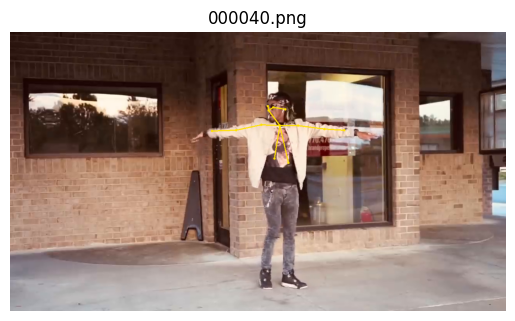

14it [00:03,  4.50it/s]

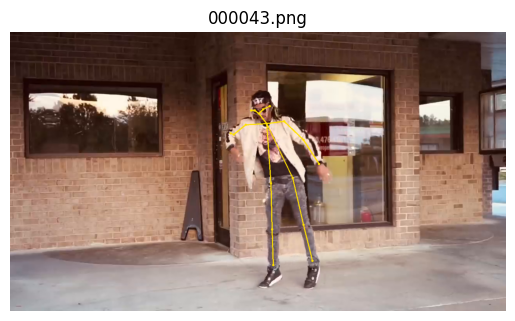

15it [00:03,  4.51it/s]

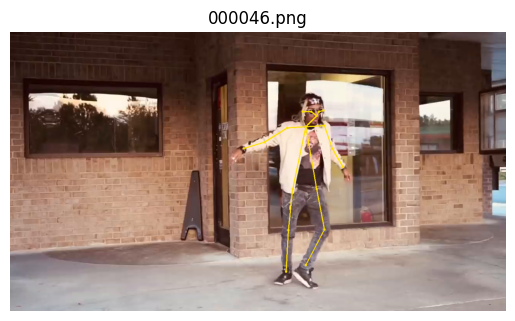

16it [00:03,  4.53it/s]

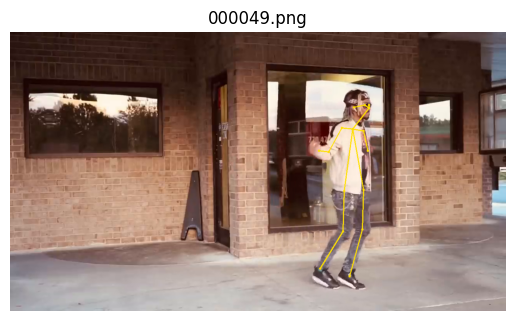

17it [00:03,  4.58it/s]

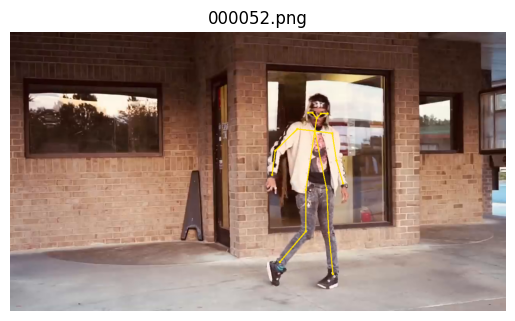

18it [00:04,  4.58it/s]

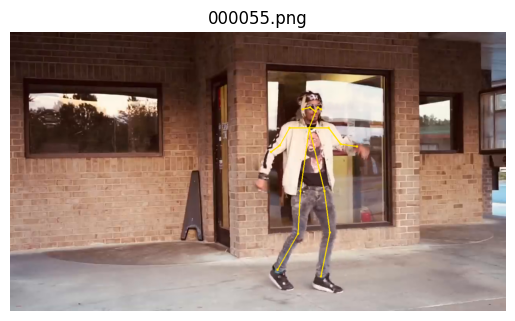

19it [00:04,  4.58it/s]

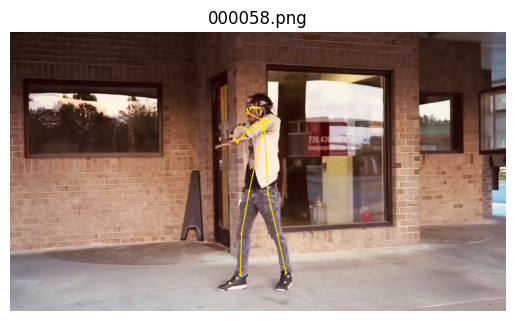

20it [00:04,  4.38it/s]


<Figure size 640x480 with 0 Axes>

In [55]:
net = PoseEstimationWithMobileNet()
checkpoint = torch.load('checkpoint_iter_370000.pth', map_location='cpu')
load_state(net, checkpoint)

poses = get_2d_kpts(net.cuda(), img_fnames[:20])

In [56]:
poses[0].keypoints

array([[667, 241],
       [665, 264],
       [614, 270],
       [589, 334],
       [594, 399],
       [712, 261],
       [715, 329],
       [ -1,  -1],
       [639, 405],
       [639, 523],
       [645, 627],
       [701, 402],
       [724, 514],
       [735, 615],
       [662, 230],
       [679, 233],
       [648, 227],
       [693, 233]], dtype=int32)

In [57]:
%cd ../

/home/devrok/aiexpert/ai-vision/3D_Reconstruction


### Helper function for optimization

In [58]:
"""This module contains simple helper functions and classes for preprocessing """
import numpy as np
import cv2
import torch
import torch.nn as nn
import torch.nn.functional as F
from pytorch3d.renderer import (
    SfMPerspectiveCameras,
    RasterizationSettings,
    MeshRenderer,
    MeshRasterizer,
    SoftPhongShader,
    PointLights,
)
from pytorch3d.structures import Meshes
from pytorch3d.renderer.mesh import Textures
DEFAULT_DTYPE = torch.float32
INVALID_TRANS=np.ones(3)*-1

def smpl_to_pose(model_type='smplx', use_hands=True, use_face=True,
                     use_face_contour=False, openpose_format='coco25'):
    ''' Returns the indices of the permutation that maps OpenPose to SMPL
        Parameters
        ----------
        model_type: str, optional
            The type of SMPL-like model that is used. The default mapping
            returned is for the SMPLX model
        use_hands: bool, optional
            Flag for adding to the returned permutation the mapping for the
            hand keypoints. Defaults to True
        use_face: bool, optional
            Flag for adding to the returned permutation the mapping for the
            face keypoints. Defaults to True
        use_face_contour: bool, optional
            Flag for appending the facial contour keypoints. Defaults to False
        openpose_format: bool, optional
            The output format of OpenPose. For now only COCO-25 and COCO-19 is
            supported. Defaults to 'coco25'
    '''
    if openpose_format.lower() == 'coco25':
        if model_type == 'smpl':
            return np.array([24, 12, 17, 19, 21, 16, 18, 20, 0, 2, 5, 8, 1, 4,
                             7, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34],
                            dtype=np.int32)
        elif model_type == 'smplh':
            body_mapping = np.array([52, 12, 17, 19, 21, 16, 18, 20, 0, 2, 5,
                                     8, 1, 4, 7, 53, 54, 55, 56, 57, 58, 59,
                                     60, 61, 62], dtype=np.int32)
            mapping = [body_mapping]
            if use_hands:
                lhand_mapping = np.array([20, 34, 35, 36, 63, 22, 23, 24, 64,
                                          25, 26, 27, 65, 31, 32, 33, 66, 28,
                                          29, 30, 67], dtype=np.int32)
                rhand_mapping = np.array([21, 49, 50, 51, 68, 37, 38, 39, 69,
                                          40, 41, 42, 70, 46, 47, 48, 71, 43,
                                          44, 45, 72], dtype=np.int32)
                mapping += [lhand_mapping, rhand_mapping]
            return np.concatenate(mapping)
        # SMPLX
        elif model_type == 'smplx':
            body_mapping = np.array([55, 12, 17, 19, 21, 16, 18, 20, 0, 2, 5,
                                     8, 1, 4, 7, 56, 57, 58, 59, 60, 61, 62,
                                     63, 64, 65], dtype=np.int32)
            mapping = [body_mapping]
            if use_hands:
                lhand_mapping = np.array([20, 37, 38, 39, 66, 25, 26, 27,
                                          67, 28, 29, 30, 68, 34, 35, 36, 69,
                                          31, 32, 33, 70], dtype=np.int32)
                rhand_mapping = np.array([21, 52, 53, 54, 71, 40, 41, 42, 72,
                                          43, 44, 45, 73, 49, 50, 51, 74, 46,
                                          47, 48, 75], dtype=np.int32)

                mapping += [lhand_mapping, rhand_mapping]

            if use_face:
                #  end_idx = 127 + 17 * use_face_contour
                face_mapping = np.arange(76, 127 + 17 * use_face_contour,
                                         dtype=np.int32)
                mapping += [face_mapping]

            return np.concatenate(mapping)
        else:
            raise ValueError('Unknown model type: {}'.format(model_type))
    elif openpose_format == 'coco19':
        if model_type == 'smpl':
            return np.array([24, 12, 17, 19, 21, 16, 18, 20, 2, 5, 8,
                             1, 4, 7, 25, 26, 27, 28],
                            dtype=np.int32)
        elif model_type == 'smpl_neutral':
            return np.array([14, 12, 8, 7, 6, 9, 10, 11, 2, 1, 0, 3, 4, 5,  16, 15,18, 17,],
                            dtype=np.int32)

        elif model_type == 'smplh':
            body_mapping = np.array([52, 12, 17, 19, 21, 16, 18, 20, 0, 2, 5,
                                     8, 1, 4, 7, 53, 54, 55, 56],
                                    dtype=np.int32)
            mapping = [body_mapping]
            if use_hands:
                lhand_mapping = np.array([20, 34, 35, 36, 57, 22, 23, 24, 58,
                                          25, 26, 27, 59, 31, 32, 33, 60, 28,
                                          29, 30, 61], dtype=np.int32)
                rhand_mapping = np.array([21, 49, 50, 51, 62, 37, 38, 39, 63,
                                          40, 41, 42, 64, 46, 47, 48, 65, 43,
                                          44, 45, 66], dtype=np.int32)
                mapping += [lhand_mapping, rhand_mapping]
            return np.concatenate(mapping)
        # SMPLX
        elif model_type == 'smplx':
            body_mapping = np.array([55, 12, 17, 19, 21, 16, 18, 20, 0, 2, 5,
                                     8, 1, 4, 7, 56, 57, 58, 59],
                                    dtype=np.int32)
            mapping = [body_mapping]
            if use_hands:
                lhand_mapping = np.array([20, 37, 38, 39, 60, 25, 26, 27,
                                          61, 28, 29, 30, 62, 34, 35, 36, 63,
                                          31, 32, 33, 64], dtype=np.int32)
                rhand_mapping = np.array([21, 52, 53, 54, 65, 40, 41, 42, 66,
                                          43, 44, 45, 67, 49, 50, 51, 68, 46,
                                          47, 48, 69], dtype=np.int32)

                mapping += [lhand_mapping, rhand_mapping]
            if use_face:
                face_mapping = np.arange(70, 70 + 51 +
                                         17 * use_face_contour,
                                         dtype=np.int32)
                mapping += [face_mapping]

            return np.concatenate(mapping)
        else:
            raise ValueError('Unknown model type: {}'.format(model_type))
    elif openpose_format == 'h36':
        if model_type == 'smpl':
            return np.array([2,5,8,1,4,7,12,24,16,18,20,17,19,21],dtype=np.int32)
        elif model_type == 'smpl_neutral':
            #return np.array([2,1,0,3,4,5,12,13,9,10,11,8,7,6], dtype=np.int32)
            return [6, 5, 4, 1, 2, 3, 16, 15, 14, 11, 12, 13, 8, 10]
    else:
        raise ValueError('Unknown joint format: {}'.format(openpose_format))

def render_trimesh(renderer,mesh,R,T, mode='np'):

    verts = torch.tensor(mesh.vertices).cuda().float()[None]
    faces = torch.tensor(mesh.faces).cuda()[None]
    colors = torch.tensor(mesh.visual.vertex_colors).float().cuda()[None,...,:3]/255
    renderer.set_camera(R,T)
    image = renderer.render_mesh_recon(verts, faces, colors=colors, mode=mode)[0]
    image = (255*image).data.cpu().numpy().astype(np.uint8)

    return image

def estimate_translation_cv2(joints_3d, joints_2d, focal_length=600, img_size=np.array([512.,512.]), proj_mat=None, cam_dist=None):
    if proj_mat is None:
        camK = np.eye(3)
        camK[0,0], camK[1,1] = focal_length, focal_length
        camK[:2,2] = img_size//2
    else:
        camK = proj_mat
    _, _, tvec,inliers = cv2.solvePnPRansac(joints_3d, joints_2d, camK, cam_dist,\
                                            flags=cv2.SOLVEPNP_EPNP,reprojectionError=20,iterationsCount=100)

    if inliers is None:
        return INVALID_TRANS
    else:
        tra_pred = tvec[:,0]
        return tra_pred

class JointMapper(nn.Module):
    def __init__(self, joint_maps=None):
        super(JointMapper, self).__init__()
        if joint_maps is None:
            self.joint_maps = joint_maps
        else:
            self.register_buffer('joint_maps',
                                 torch.tensor(joint_maps, dtype=torch.long))

    def forward(self, joints, **kwargs):
        if self.joint_maps is None:
            return joints
        else:
            return torch.index_select(joints, 1, self.joint_maps)

def transform_mat(R, t):
    ''' Creates a batch of transformation matrices
        Args:
            - R: Bx3x3 array of a batch of rotation matrices
            - t: Bx3x1 array of a batch of translation vectors
        Returns:
            - T: Bx4x4 Transformation matrix
    '''
    # No padding left or right, only add an extra row
    return torch.cat([F.pad(R, [0, 0, 0, 1]),
                      F.pad(t, [0, 0, 0, 1], value=1)], dim=2)

# transform SMPL such that the target camera extrinsic will be met
def transform_smpl(curr_extrinsic, target_extrinsic, smpl_pose, smpl_trans, T_hip):

    R_root = cv2.Rodrigues(smpl_pose[:3])[0]
    transf_global_ori = np.linalg.inv(target_extrinsic[:3,:3]) @ curr_extrinsic[:3,:3] @ R_root

    target_extrinsic[:3, -1] = curr_extrinsic[:3,:3] @ (smpl_trans + T_hip) + curr_extrinsic[:3, -1] - smpl_trans - target_extrinsic[:3,:3] @ T_hip

    smpl_pose[:3] = cv2.Rodrigues(transf_global_ori)[0].reshape(3)
    smpl_trans = np.linalg.inv(target_extrinsic[:3,:3]) @ smpl_trans # we assume

    return target_extrinsic, smpl_pose, smpl_trans

class GMoF(nn.Module):
    def __init__(self, rho=1):
        super(GMoF, self).__init__()
        self.rho = rho

    def extra_repr(self):
        return 'rho = {}'.format(self.rho)

    def forward(self, residual):
        squared_res = residual ** 2
        dist = torch.div(squared_res, squared_res + self.rho ** 2)
        return self.rho ** 2 * dist

### Rendering / projection functions

In [59]:
class PerspectiveCamera(nn.Module):

    FOCAL_LENGTH = 50*128

    def __init__(self, rotation=None, translation=None,
                 focal_length_x=None, focal_length_y=None,
                 batch_size=1,
                 center=None, dtype=torch.float32):
        super(PerspectiveCamera, self).__init__()
        self.batch_size = batch_size
        self.dtype = dtype
        # Make a buffer so that PyTorch does not complain when creating
        # the camera matrix
        self.register_buffer('zero',
                             torch.zeros([batch_size], dtype=dtype))

        if focal_length_x is None or type(focal_length_x) == float:
            focal_length_x = torch.full(
                [batch_size],
                self.FOCAL_LENGTH if focal_length_x is None else
                focal_length_x,
                dtype=dtype)

        if focal_length_y is None or type(focal_length_y) == float:
            focal_length_y = torch.full(
                [batch_size],
                self.FOCAL_LENGTH if focal_length_y is None else
                focal_length_y,
                dtype=dtype)

        self.register_buffer('focal_length_x', focal_length_x)
        self.register_buffer('focal_length_y', focal_length_y)

        if center is None:
            center = torch.zeros([batch_size, 2], dtype=dtype)
        self.register_buffer('center', center)

        if rotation is None:
            rotation = torch.eye(
                3, dtype=dtype).unsqueeze(dim=0).repeat(batch_size, 1, 1)

        rotation = nn.Parameter(rotation, requires_grad=False)
        self.register_parameter('rotation', rotation)

        if translation is None:
            translation = torch.zeros([batch_size, 3], dtype=dtype)

        translation = nn.Parameter(translation,
                                   requires_grad=True)
        self.register_parameter('translation', translation)

    def forward(self, points):
        device = points.device
        with torch.no_grad():
            camera_mat = torch.zeros([self.batch_size, 2, 2],
                                     dtype=self.dtype, device=points.device)
            camera_mat[:, 0, 0] = self.focal_length_x
            camera_mat[:, 1, 1] = self.focal_length_y


        #####################
        # Please implement code here
        # 1. apply rotation / translation on 3D keypoints (move to camera coordinate)
        # camera parameters are given as follows
        # camera rotation : self.rotation
        # camera translation : self.translation

        # 2. apply projection (project to image plance)
        # focal lengths: given in camera_mat(2 by 2)
        # [fx 0. ]
        # [0. fy ]
        # principal points: self.center
        # You can define intrinsic by yourself here.

        # 3. final output
        # img_points: torch.tensor. (batch size, # of keypoints, 2). (x,y) coordinate in image.
        #####################
        camera_transform = transform_mat(self.rotation,
                                         self.translation.unsqueeze(dim=-1))

        homog_coord = torch.ones(list(points.shape)[:-1] + [1],
                                 dtype=points.dtype,
                                 device=device)
        # Convert the points to homogeneous coordinates
        points_h = torch.cat([points, homog_coord], dim=-1)

        projected_points = torch.einsum('bki,bji->bjk',
                                        [camera_transform, points_h])

        img_points = torch.div(projected_points[:, :, :2],
                               projected_points[:, :, 2].unsqueeze(dim=-1))
        img_points = torch.einsum('bki,bji->bjk', [camera_mat, img_points]) \
            + self.center.unsqueeze(dim=1)


        return img_points

class Renderer():

    def __init__(self, principal_point=None, img_size=None, cam_intrinsic = None):

        super().__init__()

        self.device = torch.device("cuda:0")
        torch.cuda.set_device(self.device)
        self.cam_intrinsic = cam_intrinsic
        self.image_size = img_size
        self.render_img_size = np.max(img_size)

        principal_point = [-(self.cam_intrinsic[0,2]-self.image_size[1]/2.)/(self.image_size[1]/2.), -(self.cam_intrinsic[1,2]-self.image_size[0]/2.)/(self.image_size[0]/2.)]
        self.principal_point = torch.tensor(principal_point, device=self.device).unsqueeze(0)

        self.cam_R = torch.from_numpy(np.array([[-1., 0., 0.],
                                                [0., -1., 0.],
                                                [0., 0., 1.]])).cuda().float().unsqueeze(0)

        self.cam_T = torch.zeros((1,3)).cuda().float()

        half_max_length = max(self.cam_intrinsic[0:2,2])
        self.focal_length = torch.tensor([(self.cam_intrinsic[0,0]/half_max_length).astype(np.float32), \
                                          (self.cam_intrinsic[1,1]/half_max_length).astype(np.float32)]).unsqueeze(0)

        self.cameras = SfMPerspectiveCameras(focal_length=self.focal_length, principal_point=self.principal_point, R=self.cam_R, T=self.cam_T, device=self.device)

        self.lights = PointLights(device=self.device,location=[[0.0, 0.0, 0.0]], ambient_color=((1,1,1),),diffuse_color=((0,0,0),),specular_color=((0,0,0),))

        self.raster_settings = RasterizationSettings(image_size=self.render_img_size, faces_per_pixel=10, blur_radius=0, max_faces_per_bin=30000)
        self.rasterizer = MeshRasterizer(cameras=self.cameras, raster_settings=self.raster_settings)

        self.shader = SoftPhongShader(device=self.device, cameras=self.cameras, lights=self.lights)

        self.renderer = MeshRenderer(rasterizer=self.rasterizer, shader=self.shader)

    def set_camera(self, R, T):
        self.cam_R = R
        self.cam_T = T
        self.cam_R[:, :2, :] *= -1.0
        self.cam_T[:, :2] *= -1.0
        self.cam_R = torch.transpose(self.cam_R,1,2)
        self.cameras = SfMPerspectiveCameras(focal_length=self.focal_length, principal_point=self.principal_point, R=self.cam_R, T=self.cam_T, device=self.device)
        self.rasterizer = MeshRasterizer(cameras=self.cameras, raster_settings=self.raster_settings)
        self.shader = SoftPhongShader(device=self.device, cameras=self.cameras, lights=self.lights)
        self.renderer = MeshRenderer(rasterizer=self.rasterizer, shader=self.shader)

    def render_mesh_recon(self, verts, faces, R=None, T=None, colors=None, mode='npat'):
        '''
        mode: normal, phong, texture
        '''
        with torch.no_grad():

            mesh = Meshes(verts, faces)

            normals = torch.stack(mesh.verts_normals_list())
            front_light = -torch.tensor([0,0,-1]).float().to(verts.device)
            shades = (normals * front_light.view(1,1,3)).sum(-1).clamp(min=0).unsqueeze(-1).expand(-1,-1,3)
            results = []
            # shading
            if 'p' in mode:
                mesh_shading = Meshes(verts, faces, textures=Textures(verts_rgb=shades))
                image_phong = self.renderer(mesh_shading)
                results.append(image_phong)
            # normal
            if 'n' in mode:
                normals_vis = normals* 0.5 + 0.5
                normals_vis = normals_vis[:,:,[2,1,0]]
                mesh_normal = Meshes(verts, faces, textures=Textures(verts_rgb=normals_vis))
                image_normal = self.renderer(mesh_normal)
                results.append(image_normal)
            return  torch.cat(results, axis=1)


### Optimization target

In [60]:
robustifier = GMoF(rho=100)

def joints_2d_loss(gt_joints_2d=None, joints_2d=None, joint_confidence=None):

    joint_diff = robustifier(gt_joints_2d - joints_2d)
    joints_2dloss = torch.mean((joint_confidence).unsqueeze(-1) ** 2 * joint_diff)
    return joints_2dloss

## Let's optimize SMPL on 2D keypoints!

In [61]:
# we need to get SMPL vertices here
from smplx import SMPL
import trimesh
import cv2
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
OPENPOSE_JNT_CONF_THRS = 0.3
OPT_NUM_ITERS = 500
LR = 1e-1

input_img = cv2.imread(str(img_fnames[0]))
focal_length = max(input_img.shape[0], input_img.shape[1])
cam_intrinsics = np.array([[focal_length, 0., input_img.shape[1]//2],
                            [0., focal_length, input_img.shape[0]//2],
                            [0., 0., 1.]])

cam = PerspectiveCamera(focal_length_x=torch.tensor(cam_intrinsics[0, 0], dtype=torch.float32),
                        focal_length_y=torch.tensor(cam_intrinsics[1, 1], dtype=torch.float32),
                        center=torch.tensor(cam_intrinsics[0:2, 2]).unsqueeze(0)).to(device)

smpl2op_mapping = torch.tensor(smpl_to_pose(model_type='smpl', use_hands=False, use_face=False,
                                            use_face_contour=False, openpose_format='coco19'), dtype=torch.long).to(device)
renderer = Renderer(img_size = [input_img.shape[0], input_img.shape[1]], cam_intrinsic=cam_intrinsics)


def optimize_kpts(image, pose, smpl_param=None):
    smpl_model = SMPL(model_path=SMPL_DIR, gender='neutral').to(device)

    if smpl_param is None:
        # smpl_output = smpl_model(betas=torch.zeros(1,10).to(device),
        #                         body_pose=torch.zeros(1,72).to(device),
        #                         global_orient=None,
        #                         transl=None)
        # smpl_verts = smpl_output.vertices.data.cpu().numpy().squeeze()

        smpl_shape = torch.zeros(10)
        smpl_pose = torch.zeros(72)
        smpl_trans = torch.zeros(3)
    else:
        # smpl_output = smpl_model(betas=torch.from_numpy(smpl_param['beta']).squeeze().unsqueeze(0).to(device),
        #                         body_pose=torch.from_numpy(smpl_param['body_pose']).squeeze().unsqueeze(0).to(device),
        #                         global_orient=torch.from_numpy(smpl_param['global_orient']).squeeze().unsqueeze(0).to(device),
        #                         transl=torch.from_numpy(smpl_param['transl']).squeeze().unsqueeze(0).to(device))

        smpl_shape = torch.from_numpy(smpl_param['smpl_betas'][0]).squeeze()
        smpl_pose = torch.from_numpy(smpl_param['smpl_thetas'][0]).squeeze()


        smpl_verts = smpl_param['verts'][0]
        pj2d_org = smpl_param['pj2d_org'][0]
        joints3d = smpl_param['joints'][0]
        last_j3d = joints3d.copy()
        tra_pred = estimate_translation_cv2(joints3d, pj2d_org, proj_mat=cam_intrinsics)

        smpl_trans = tra_pred

    # openpose = openpose.T
    openpose_j2d = torch.from_numpy(pose.keypoints).to(device)

    # do filtering
    openpose_conf = torch.ones(len(openpose_j2d)).to(device)
    for i, kpt in enumerate(openpose_j2d):
        if kpt[0] < 0 or kpt[1] < 0:
            openpose_conf[i] = 0

    # define optimization targets
    opt_betas = torch.tensor(smpl_shape[None], dtype=torch.float32, requires_grad=True, device=device)
    opt_pose = torch.tensor(smpl_pose[None], dtype=torch.float32, requires_grad=True, device=device)
    opt_trans = torch.tensor(smpl_trans[None], dtype=torch.float32, requires_grad=True, device=device)

    opt_params = [{'params': opt_betas, 'lr': LR},
                {'params': opt_pose, 'lr': LR},
                {'params': opt_trans, 'lr': LR}]
    optimizer = torch.optim.Adam(opt_params, lr=2e-3, betas=(0.9, 0.999))

    loop = tqdm(range(OPT_NUM_ITERS))
    for it in loop:
        optimizer.zero_grad()

        smpl_output = smpl_model(betas=opt_betas,
                                  body_pose=opt_pose[:,3:],
                                  global_orient=opt_pose[:,:3],
                                  transl=opt_trans)
        smpl_verts = smpl_output.vertices.data.cpu().numpy().squeeze()

        smpl_joints_2d = cam(torch.index_select(smpl_output.joints, 1, smpl2op_mapping))

        loss = dict()
        loss['J2D_Loss'] = joints_2d_loss(openpose_j2d, smpl_joints_2d, openpose_conf)
        loss['beta_reg'] = opt_betas.abs().mean()

        tot_loss = loss['J2D_Loss'] + 10.0 * loss['beta_reg']
        tot_loss.backward()
        optimizer.step()

        l_str = 'Iter: %d' % it
        for k in loss:
            l_str += ', %s: %0.4f' % (k, loss[k].item())
            loop.set_description(l_str)

    smpl_mesh = trimesh.Trimesh(smpl_verts, smpl_model.faces, process=False)

    cam_extrinsics = np.eye(4)
    R = torch.tensor(cam_extrinsics[:3,:3])[None].float()
    T = torch.tensor(cam_extrinsics[:3, 3])[None].float()
    rendered_image = render_trimesh(renderer, smpl_mesh, R, T, 'n')
    if input_img.shape[0] < input_img.shape[1]:
      rendered_image = rendered_image[abs(input_img.shape[0]-input_img.shape[1])//2:(input_img.shape[0]+input_img.shape[1])//2,...]
    else:
      rendered_image = rendered_image[:,abs(input_img.shape[0]-input_img.shape[1])//2:(input_img.shape[0]+input_img.shape[1])//2]
    valid_mask = (rendered_image[:,:,-1] > 0)[:, :, np.newaxis]
    output_img = (rendered_image[:,:,:-1] * valid_mask + image * (1 - valid_mask)).astype(np.uint8)

    plt.imshow(output_img)
    plt.axis('off')
    plt.title("after optimization")
    plt.show()

## Let's test Naive fitting of SMPL on 2d keypoints!

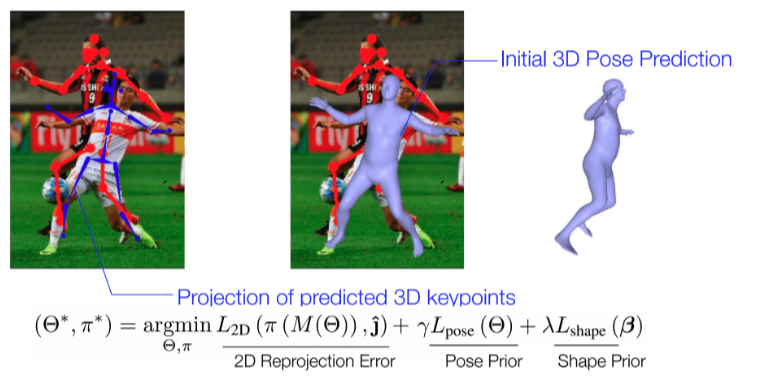

### Test without good initial estimation

/tmp/ipykernel_918453/2935180199.py:66: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  opt_betas = torch.tensor(smpl_shape[None], dtype=torch.float32, requires_grad=True, device=device)
/tmp/ipykernel_918453/2935180199.py:67: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  opt_pose = torch.tensor(smpl_pose[None], dtype=torch.float32, requires_grad=True, device=device)
/tmp/ipykernel_918453/2935180199.py:68: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  opt_trans = torch.tensor(smpl_trans[None], dtype=torch.float32, requires_grad=True, device

Iter: 499, J2D_Loss: 29.4399, beta_reg: 1.2986: 100%|██████████| 500/500 [00:06<00:00, 82.44it/s]  


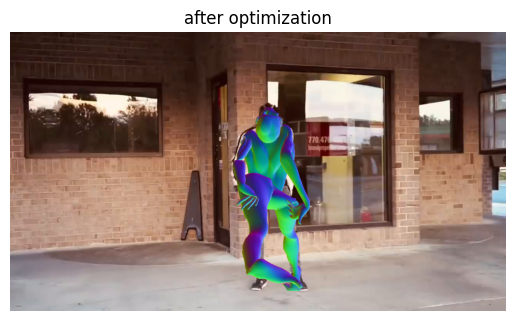

Iter: 499, J2D_Loss: 6.5428, beta_reg: 0.3206: 100%|██████████| 500/500 [00:05<00:00, 85.34it/s]   


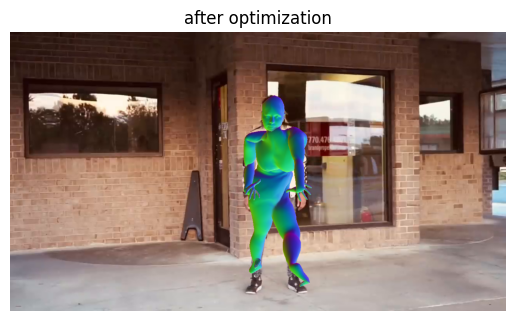

Iter: 499, J2D_Loss: 8.6275, beta_reg: 0.4575: 100%|██████████| 500/500 [00:05<00:00, 85.19it/s]   


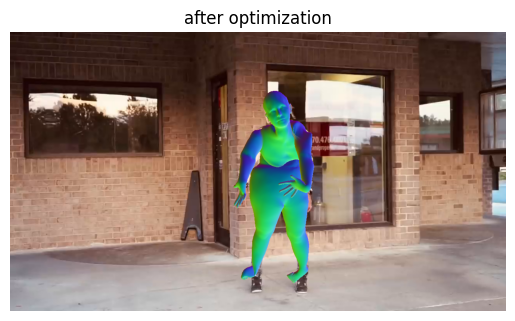

Iter: 499, J2D_Loss: 4.8869, beta_reg: 0.0032: 100%|██████████| 500/500 [00:05<00:00, 85.68it/s]  


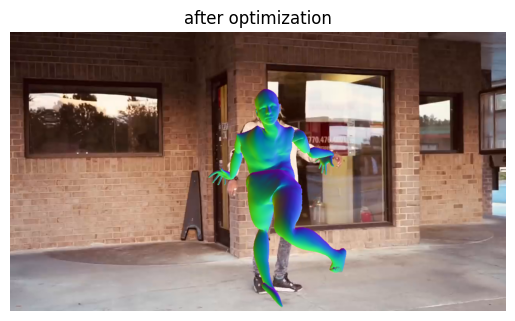

Iter: 499, J2D_Loss: 4.4388, beta_reg: 0.5766: 100%|██████████| 500/500 [00:05<00:00, 85.43it/s]  


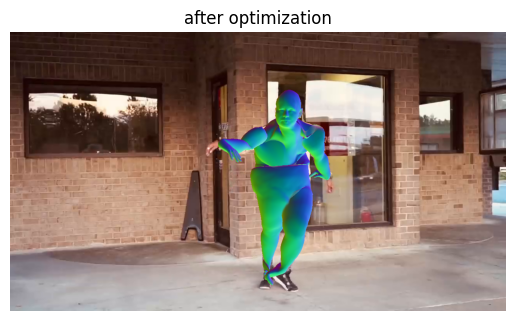

In [62]:
for i in range(5):
    image = cv2.imread(str(img_fnames[i]))[...,[2,1,0]]
    optimize_kpts(image, poses[i])

## Let's leverage off-the-shelf estimators for better initialization!

### ROMP (ICCV 2021) to get good initial SMPL pose
Single-view SMPL regression model

In [94]:
!pwd

/home/devrok/aiexpert/ai-vision/3D_Reconstruction


In [95]:
# do romp estimations on
!mkdir -p ROMP
!romp --mode=video --calc_smpl --render_mesh -i=smpldata/images -o=ROMP --smpl_path ./SMPL_NEUTRAL.pth

please prepare SMPL model files following instructions at https://github.com/Arthur151/ROMP/blob/master/simple_romp/README.md#installation
Using ROMP v1
ROMP 'forward' executed in 0.8758s, FPS 1.1
[                                        ]   1/205 (  0%) 204 to go 
ROMP 'forward' executed in 0.0634s, FPS 15.8
[                                        ]   2/205 (  0%) 203 to go 
ROMP 'forward' executed in 0.0554s, FPS 18.1
[                                        ]   3/205 (  1%) 202 to go 
ROMP 'forward' executed in 0.0531s, FPS 18.8
[                                        ]   4/205 (  1%) 201 to go 
ROMP 'forward' executed in 0.0555s, FPS 18.0
[                                        ]   5/205 (  2%) 200 to go 
ROMP 'forward' executed in 0.0539s, FPS 18.6
[-                                       ]   6/205 (  2%) 199 to go 
ROMP 'forward' executed in 0.0559s, FPS 17.9
[-                                       ]   7/205 (  3%) 198 to go 
ROMP 'forward' executed in 0.0534s, FPS 18.7
[-   

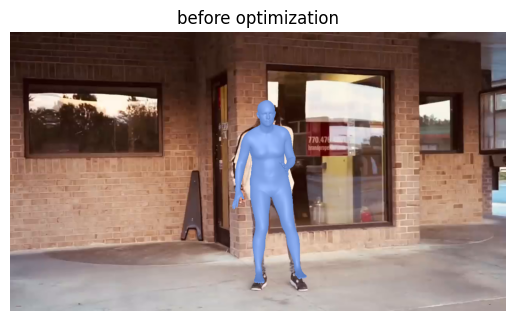

/tmp/ipykernel_918453/1510398107.py:66: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  opt_betas = torch.tensor(smpl_shape[None], dtype=torch.float32, requires_grad=True, device=device)
/tmp/ipykernel_918453/1510398107.py:67: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  opt_pose = torch.tensor(smpl_pose[None], dtype=torch.float32, requires_grad=True, device=device)


Iter: 249, J2D_Loss: 5520.5448, beta_reg: 0.1299, pose_prior: 2192.2017, angle_prior: 276.6138: 100%|██████████| 250/250 [00:03<00:00, 71.37it/s]


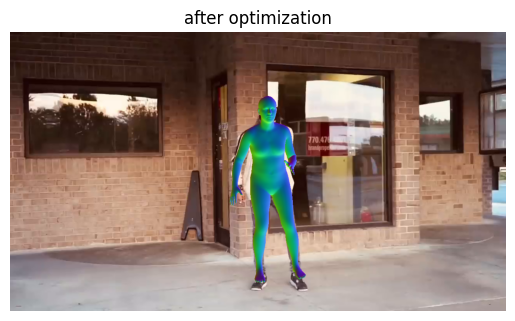

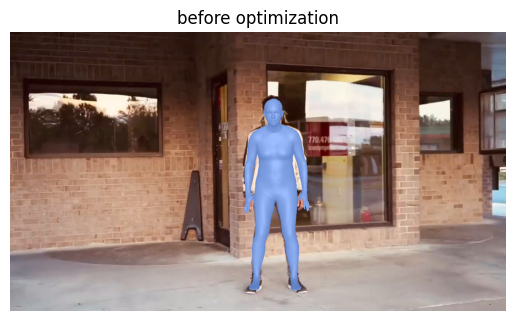

Iter: 249, J2D_Loss: 6310.7552, beta_reg: 0.0591, pose_prior: 1800.0565, angle_prior: 339.7244: 100%|██████████| 250/250 [00:03<00:00, 72.17it/s]


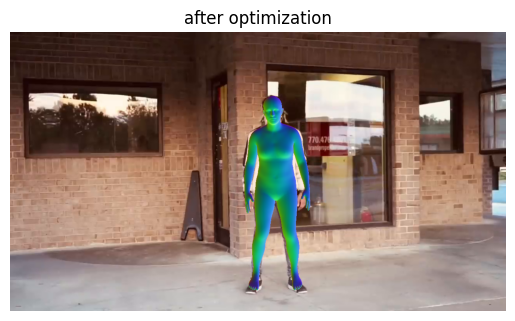

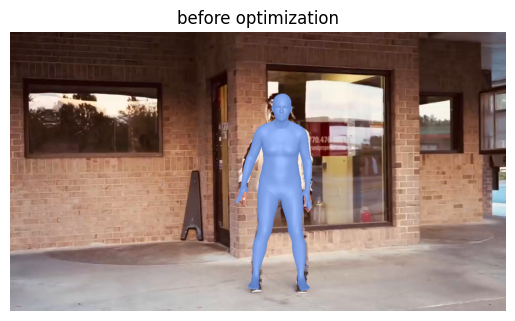

Iter: 249, J2D_Loss: 6091.2857, beta_reg: 0.3918, pose_prior: 1883.0870, angle_prior: 271.3268: 100%|██████████| 250/250 [00:03<00:00, 72.85it/s]


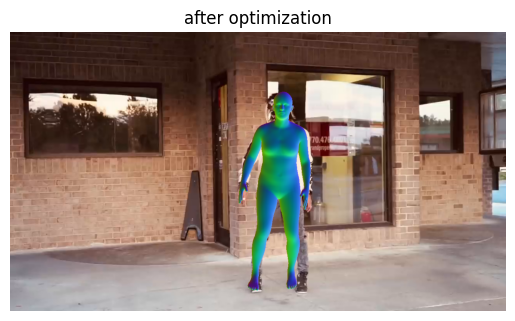

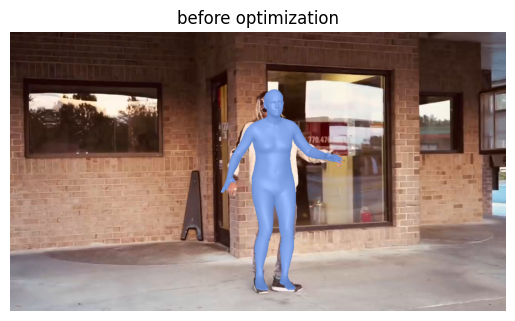

Iter: 249, J2D_Loss: 6092.1777, beta_reg: 0.0171, pose_prior: 2157.7170, angle_prior: 194.2251: 100%|██████████| 250/250 [00:03<00:00, 70.57it/s]


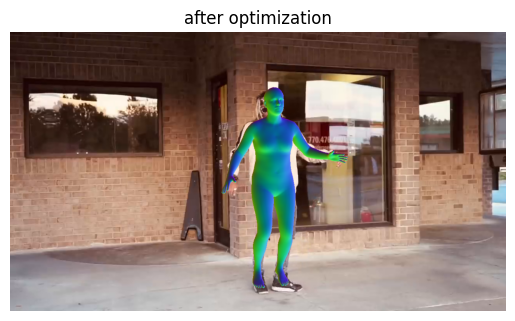

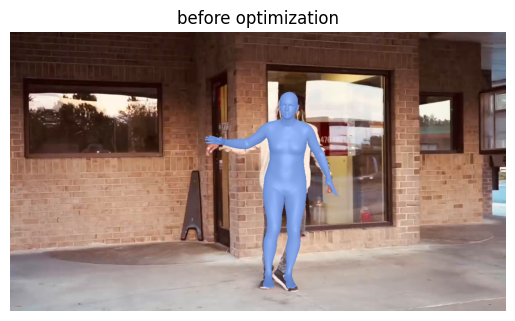

Iter: 249, J2D_Loss: 7174.6524, beta_reg: 0.0098, pose_prior: 2229.3999, angle_prior: 207.4070: 100%|██████████| 250/250 [00:03<00:00, 70.55it/s]


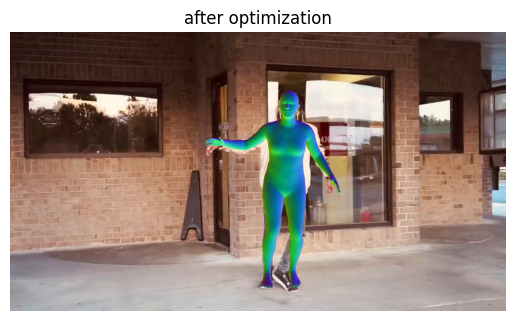

In [97]:
# Now, load romp results and optimize!

LR=1e-3
OPT_NUM_ITERS=250

for i in range(5):
    image = cv2.imread(str(img_fnames[i]))[...,[2,1,0]]

    before_optimize = cv2.imread("ROMP/"+img_fnames[i].name[:-4] + ".png")[..., [2,1,0]]
    w = before_optimize.shape[1]
    before_optimize = before_optimize[:, w//2:]
    plt.imshow(before_optimize)
    plt.title("before optimization")
    plt.axis('off')
    plt.show()

    smpl_param = np.load("ROMP/"+img_fnames[i].name[:-4] + ".npz", allow_pickle=True)['results'][()]
    optimize_kpts(image, poses[i], smpl_param)

## Let's leverage pose prior

In [98]:
pose_prior_weight=4.78
shape_prior_weight=5
angle_prior_weight=15.2

In [99]:
import os, sys


num_joints = 25
joints_to_ign = [1,9,12]        # (neck, lr hip (due to estimator ambiguity))
joint_weights = torch.ones(num_joints)
joint_weights[joints_to_ign] = 0
joint_weights = joint_weights.reshape((-1,1)).cuda()


class MaxMixturePrior(nn.Module):
    def __init__(self, prior_folder='prior',
                 num_gaussians=6, dtype=DEFAULT_DTYPE, epsilon=1e-16,
                 use_merged=True,
                 **kwargs):
        super(MaxMixturePrior, self).__init__()

        if dtype == DEFAULT_DTYPE:
            np_dtype = np.float32
        elif dtype == torch.float64:
            np_dtype = np.float64
        else:
            print('Unknown float type {}, exiting!'.format(dtype))
            sys.exit(-1)

        self.num_gaussians = num_gaussians
        self.epsilon = epsilon
        self.use_merged = use_merged
        gmm_fn = 'gmm_{:02d}.pkl'.format(num_gaussians)

        full_gmm_fn = os.path.join(prior_folder, gmm_fn)
        if not os.path.exists(full_gmm_fn):
            print('The path to the mixture prior "{}"'.format(full_gmm_fn) +
                  ' does not exist, exiting!')
            sys.exit(-1)

        with open(full_gmm_fn, 'rb') as f:
            # import pickle5 as pickle
            import pickle
            gmm = pickle.load(f, encoding='latin1')

        if type(gmm) == dict:
            means = gmm['means'].astype(np_dtype)
            covs = gmm['covars'].astype(np_dtype)
            weights = gmm['weights'].astype(np_dtype)
        elif 'sklearn.mixture.gmm.GMM' in str(type(gmm)):
            means = gmm.means_.astype(np_dtype)
            covs = gmm.covars_.astype(np_dtype)
            weights = gmm.weights_.astype(np_dtype)
        else:
            print('Unknown type for the prior: {}, exiting!'.format(type(gmm)))
            sys.exit(-1)

        self.register_buffer('means', torch.tensor(means, dtype=dtype))

        self.register_buffer('covs', torch.tensor(covs, dtype=dtype))

        precisions = [np.linalg.inv(cov) for cov in covs]
        precisions = np.stack(precisions).astype(np_dtype)

        self.register_buffer('precisions',
                             torch.tensor(precisions, dtype=dtype))

        # The constant term:
        sqrdets = np.array([(np.sqrt(np.linalg.det(c)))
                            for c in gmm['covars']])
        const = (2 * np.pi)**(69 / 2.)

        nll_weights = np.asarray(gmm['weights'] / (const *
                                                   (sqrdets / sqrdets.min())))
        nll_weights = torch.tensor(nll_weights, dtype=dtype).unsqueeze(dim=0)
        self.register_buffer('nll_weights', nll_weights)

        weights = torch.tensor(gmm['weights'], dtype=dtype).unsqueeze(dim=0)
        self.register_buffer('weights', weights)

        self.register_buffer('pi_term',
                             torch.log(torch.tensor(2 * np.pi, dtype=dtype)))

        cov_dets = [np.log(np.linalg.det(cov.astype(np_dtype)) + epsilon)
                    for cov in covs]
        self.register_buffer('cov_dets',
                             torch.tensor(cov_dets, dtype=dtype))

        # The dimensionality of the random variable
        self.random_var_dim = self.means.shape[1]

    def get_mean(self):
        ''' Returns the mean of the mixture '''
        mean_pose = torch.matmul(self.weights, self.means)
        return mean_pose

    def merged_log_likelihood(self, pose, betas):
        diff_from_mean = pose.unsqueeze(dim=1) - self.means

        prec_diff_prod = torch.einsum('mij,bmj->bmi',
                                      [self.precisions, diff_from_mean])
        diff_prec_quadratic = (prec_diff_prod * diff_from_mean).sum(dim=-1)

        curr_loglikelihood = 0.5 * diff_prec_quadratic - \
            torch.log(self.nll_weights)
        #  curr_loglikelihood = 0.5 * (self.cov_dets.unsqueeze(dim=0) +
        #  self.random_var_dim * self.pi_term +
        #  diff_prec_quadratic
        #  ) - torch.log(self.weights)

        min_likelihood, _ = torch.min(curr_loglikelihood, dim=1)
        return min_likelihood

    def log_likelihood(self, pose, betas, *args, **kwargs):
        ''' Create graph operation for negative log-likelihood calculation
        '''
        likelihoods = []

        for idx in range(self.num_gaussians):
            mean = self.means[idx]
            prec = self.precisions[idx]
            cov = self.covs[idx]
            diff_from_mean = pose - mean

            curr_loglikelihood = torch.einsum('bj,ji->bi',
                                              [diff_from_mean, prec])
            curr_loglikelihood = torch.einsum('bi,bi->b',
                                              [curr_loglikelihood,
                                               diff_from_mean])
            cov_term = torch.log(torch.det(cov) + self.epsilon)
            curr_loglikelihood += 0.5 * (cov_term +
                                         self.random_var_dim *
                                         self.pi_term)
            likelihoods.append(curr_loglikelihood)

        log_likelihoods = torch.stack(likelihoods, dim=1)
        min_idx = torch.argmin(log_likelihoods, dim=1)
        weight_component = self.nll_weights[:, min_idx]
        weight_component = -torch.log(weight_component)

        return weight_component + log_likelihoods[:, min_idx]

    def forward(self, pose, betas):
        if self.use_merged:
            return self.merged_log_likelihood(pose, betas)
        else:
            return self.log_likelihood(pose, betas)

def angle_prior(pose):
    """
    Angle prior that penalizes unnatural bending of the knees and elbows
    """
    # We subtract 3 because pose does not include the global rotation of the model
    return torch.exp(pose[:, [55-3, 58-3, 12-3, 15-3]] * torch.tensor([1., -1., -1, -1.], device=pose.device)) ** 2


robustifier = GMoF(rho=100)

def joints_2d_loss(gt_joints_2d=None, joints_2d=None, joint_confidence=None):
    scaleFactor = 112 * 2      # -112 and 112 space originally used in SIMPLify, to balance with other terms.
    joint_diff = scaleFactor * (gt_joints_2d - joints_2d)

    joint_diff = robustifier(joint_diff)
    joints_2dloss = torch.mean((joint_confidence).unsqueeze(-1) ** 2 * joint_diff)
    return joints_2dloss


In [100]:
pose_prior = MaxMixturePrior(prior_folder='./smpldata/spin', num_gaussians=8, dtype=torch.float32).cuda()

In [101]:
# we need to get SMPL vertices here
from smplx import SMPL
import trimesh
import cv2
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
OPENPOSE_JNT_CONF_THRS = 0.3
OPT_NUM_ITERS = 500
LR = 1e-2

input_img = cv2.imread(str(img_fnames[0]))
focal_length = max(input_img.shape[0], input_img.shape[1])
cam_intrinsics = np.array([[focal_length, 0., input_img.shape[1]//2],
                            [0., focal_length, input_img.shape[0]//2],
                            [0., 0., 1.]])

cam = PerspectiveCamera(focal_length_x=torch.tensor(cam_intrinsics[0, 0], dtype=torch.float32),
                        focal_length_y=torch.tensor(cam_intrinsics[1, 1], dtype=torch.float32),
                        center=torch.tensor(cam_intrinsics[0:2, 2]).unsqueeze(0)).to(device)

smpl2op_mapping = torch.tensor(smpl_to_pose(model_type='smpl', use_hands=False, use_face=False,
                                            use_face_contour=False, openpose_format='coco19'), dtype=torch.long).to(device)
renderer = Renderer(img_size = [input_img.shape[0], input_img.shape[1]], cam_intrinsic=cam_intrinsics)


def optimize_kpts(image, pose, smpl_param=None):
    smpl_model = SMPL(model_path=SMPL_DIR, gender='neutral').to(device)

    if smpl_param is None:
        # smpl_output = smpl_model(betas=torch.zeros(1,10).to(device),
        #                         body_pose=torch.zeros(1,72).to(device),
        #                         global_orient=None,
        #                         transl=None)
        # smpl_verts = smpl_output.vertices.data.cpu().numpy().squeeze()

        smpl_shape = torch.zeros(10)
        smpl_pose = torch.zeros(72)
        smpl_trans = torch.zeros(3)
    else:
        # smpl_output = smpl_model(betas=torch.from_numpy(smpl_param['beta']).squeeze().unsqueeze(0).to(device),
        #                         body_pose=torch.from_numpy(smpl_param['body_pose']).squeeze().unsqueeze(0).to(device),
        #                         global_orient=torch.from_numpy(smpl_param['global_orient']).squeeze().unsqueeze(0).to(device),
        #                         transl=torch.from_numpy(smpl_param['transl']).squeeze().unsqueeze(0).to(device))

        smpl_shape = torch.from_numpy(smpl_param['smpl_betas'][0]).squeeze()
        smpl_pose = torch.from_numpy(smpl_param['smpl_thetas'][0]).squeeze()


        smpl_verts = smpl_param['verts'][0]
        pj2d_org = smpl_param['pj2d_org'][0]
        joints3d = smpl_param['joints'][0]
        last_j3d = joints3d.copy()
        tra_pred = estimate_translation_cv2(joints3d, pj2d_org, proj_mat=cam_intrinsics)

        smpl_trans = tra_pred

    # openpose = openpose.T
    openpose_j2d = torch.from_numpy(pose.keypoints).to(device)

    # do filtering
    openpose_conf = torch.ones(len(openpose_j2d)).to(device)
    for i, kpt in enumerate(openpose_j2d):
        if kpt[0] < 0 or kpt[1] < 0:
            openpose_conf[i] = 0

    # define optimization targets
    opt_betas = torch.tensor(smpl_shape[None], dtype=torch.float32, requires_grad=True, device=device)
    opt_pose = torch.tensor(smpl_pose[None], dtype=torch.float32, requires_grad=True, device=device)
    opt_trans = torch.tensor(smpl_trans[None], dtype=torch.float32, requires_grad=True, device=device)

    opt_params = [{'params': opt_betas, 'lr': LR},
                {'params': opt_pose, 'lr': LR},
                {'params': opt_trans, 'lr': LR}]
    optimizer = torch.optim.Adam(opt_params, lr=LR, betas=(0.9, 0.999))

    loop = tqdm(range(OPT_NUM_ITERS))
    for it in loop:
        optimizer.zero_grad()

        smpl_output = smpl_model(betas=opt_betas,
                                  body_pose=opt_pose[:,3:],
                                  global_orient=opt_pose[:,:3],
                                  transl=opt_trans)
        smpl_verts = smpl_output.vertices.data.cpu().numpy().squeeze()

        smpl_joints_2d = cam(torch.index_select(smpl_output.joints, 1, smpl2op_mapping))

        loss = dict()
        loss['J2D_Loss'] = joints_2d_loss(openpose_j2d, smpl_joints_2d, openpose_conf)
        loss['beta_reg'] = (shape_prior_weight ** 2) * (opt_betas**2).sum(dim=-1)
        loss['pose_prior'] = (pose_prior_weight ** 2) * pose_prior(opt_pose[:,3:], opt_betas)
        loss['angle_prior'] = (angle_prior_weight ** 2) * angle_prior(opt_pose[:,3:]).sum(dim=-1)


        tot_loss = loss['J2D_Loss'] + loss['beta_reg'] + loss['pose_prior'] + loss['angle_prior']
        tot_loss.backward()
        optimizer.step()

        l_str = 'Iter: %d' % it
        for k in loss:
            l_str += ', %s: %0.4f' % (k, loss[k].item())
            loop.set_description(l_str)

    smpl_mesh = trimesh.Trimesh(smpl_verts, smpl_model.faces, process=False)

    cam_extrinsics = np.eye(4)
    R = torch.tensor(cam_extrinsics[:3,:3])[None].float()
    T = torch.tensor(cam_extrinsics[:3, 3])[None].float()
    rendered_image = render_trimesh(renderer, smpl_mesh, R, T, 'n')
    if input_img.shape[0] < input_img.shape[1]:
      rendered_image = rendered_image[abs(input_img.shape[0]-input_img.shape[1])//2:(input_img.shape[0]+input_img.shape[1])//2,...]
    else:
      rendered_image = rendered_image[:,abs(input_img.shape[0]-input_img.shape[1])//2:(input_img.shape[0]+input_img.shape[1])//2]
    valid_mask = (rendered_image[:,:,-1] > 0)[:, :, np.newaxis]
    output_img = (rendered_image[:,:,:-1] * valid_mask + image * (1 - valid_mask)).astype(np.uint8)

    plt.imshow(output_img)
    plt.axis('off')
    plt.title("after optimization")
    plt.show()

/tmp/ipykernel_918453/1510398107.py:66: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  opt_betas = torch.tensor(smpl_shape[None], dtype=torch.float32, requires_grad=True, device=device)
/tmp/ipykernel_918453/1510398107.py:67: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  opt_pose = torch.tensor(smpl_pose[None], dtype=torch.float32, requires_grad=True, device=device)


Iter: 249, J2D_Loss: 5520.5448, beta_reg: 0.1299, pose_prior: 2192.2017, angle_prior: 276.6138: 100%|██████████| 250/250 [00:03<00:00, 70.29it/s]


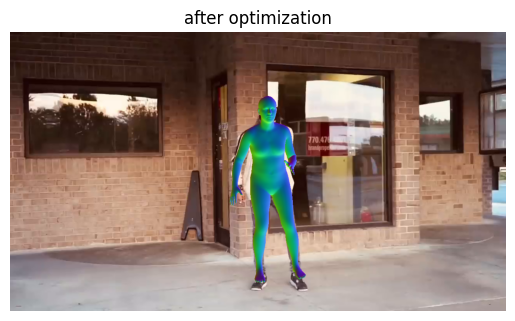

Iter: 249, J2D_Loss: 6310.7552, beta_reg: 0.0591, pose_prior: 1800.0565, angle_prior: 339.7244: 100%|██████████| 250/250 [00:03<00:00, 70.90it/s]


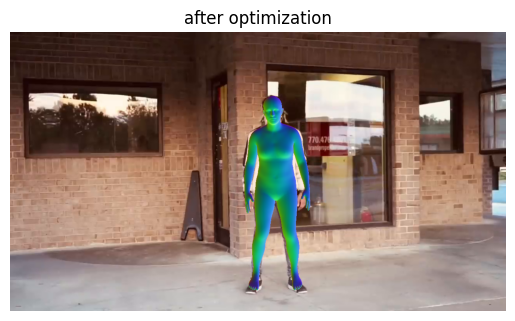

Iter: 249, J2D_Loss: 6091.2857, beta_reg: 0.3918, pose_prior: 1883.0870, angle_prior: 271.3268: 100%|██████████| 250/250 [00:03<00:00, 70.34it/s]


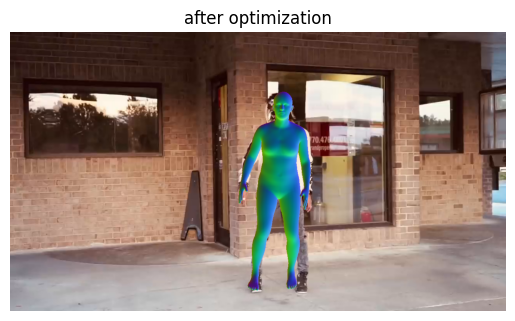

Iter: 249, J2D_Loss: 6092.1777, beta_reg: 0.0171, pose_prior: 2157.7170, angle_prior: 194.2251: 100%|██████████| 250/250 [00:03<00:00, 70.27it/s]


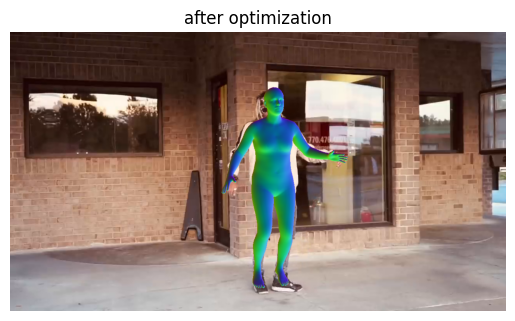

Iter: 249, J2D_Loss: 7174.6524, beta_reg: 0.0098, pose_prior: 2229.3999, angle_prior: 207.4070: 100%|██████████| 250/250 [00:03<00:00, 70.05it/s]


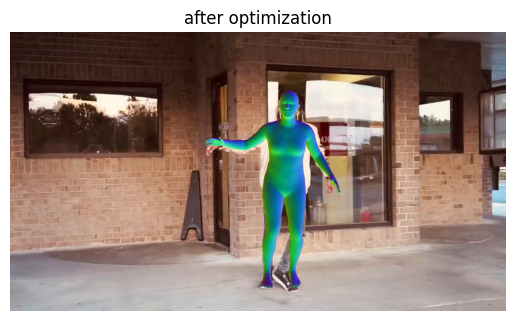

Iter: 249, J2D_Loss: 5416.6401, beta_reg: 0.6132, pose_prior: 2298.7058, angle_prior: 172.5595: 100%|██████████| 250/250 [00:03<00:00, 70.38it/s]


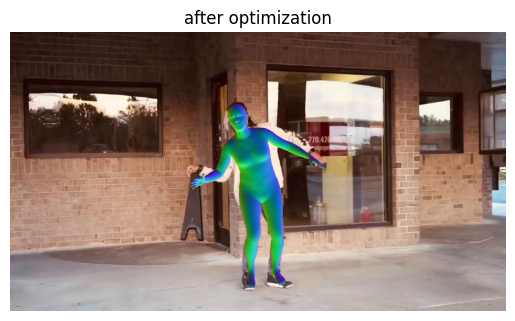

Iter: 249, J2D_Loss: 7501.9559, beta_reg: 0.0091, pose_prior: 2218.7622, angle_prior: 217.4386: 100%|██████████| 250/250 [00:03<00:00, 70.62it/s]


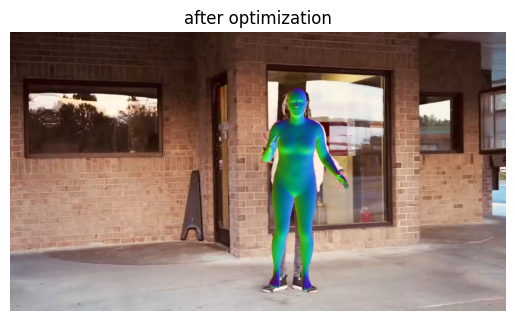

Iter: 249, J2D_Loss: 8012.0159, beta_reg: 0.0249, pose_prior: 2179.5032, angle_prior: 146.3384: 100%|██████████| 250/250 [00:03<00:00, 70.68it/s]


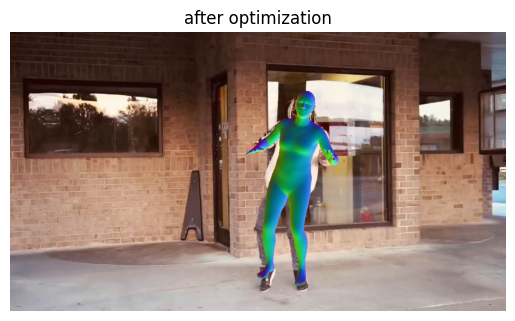

Iter: 249, J2D_Loss: 6375.8473, beta_reg: 0.0360, pose_prior: 2149.5073, angle_prior: 241.2389: 100%|██████████| 250/250 [00:03<00:00, 70.86it/s]


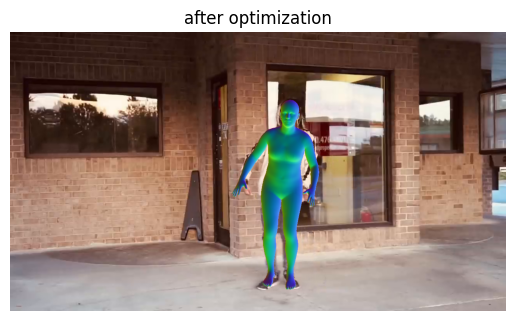

Iter: 249, J2D_Loss: 6550.5706, beta_reg: 0.0152, pose_prior: 2256.1116, angle_prior: 160.7255: 100%|██████████| 250/250 [00:03<00:00, 70.66it/s]


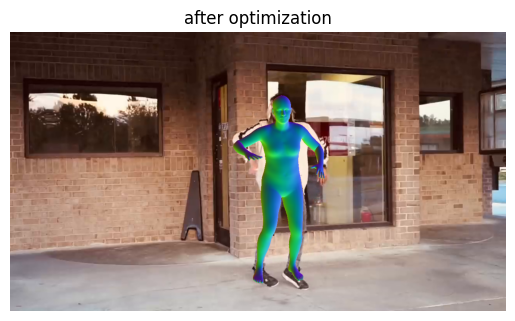

Iter: 249, J2D_Loss: 6596.3971, beta_reg: 0.0377, pose_prior: 2244.3694, angle_prior: 357.4244: 100%|██████████| 250/250 [00:03<00:00, 70.74it/s]


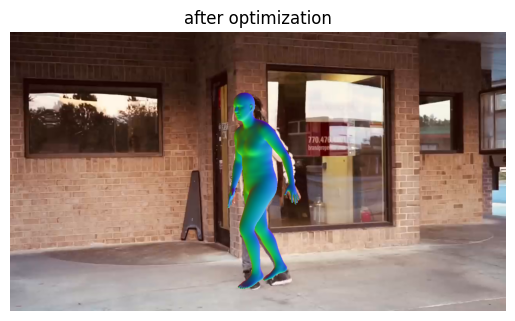

Iter: 249, J2D_Loss: 6897.4480, beta_reg: 0.0376, pose_prior: 2275.0437, angle_prior: 268.5010: 100%|██████████| 250/250 [00:03<00:00, 70.65it/s]


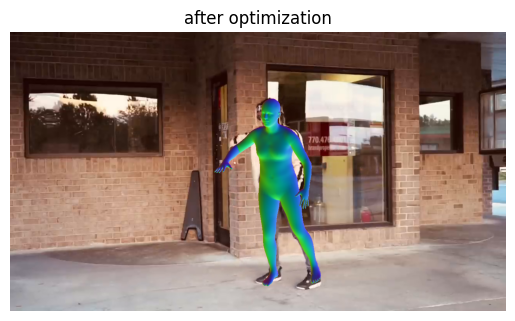

Iter: 249, J2D_Loss: 5763.8730, beta_reg: 0.0469, pose_prior: 2236.4495, angle_prior: 222.1244: 100%|██████████| 250/250 [00:03<00:00, 70.57it/s]


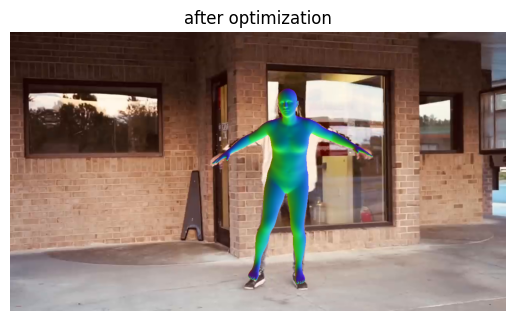

Iter: 249, J2D_Loss: 5528.5552, beta_reg: 0.0390, pose_prior: 2223.8315, angle_prior: 231.3770: 100%|██████████| 250/250 [00:03<00:00, 70.40it/s]


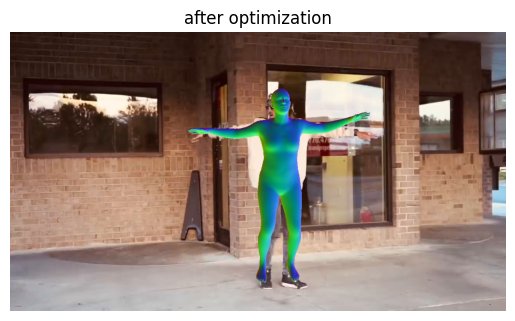

Iter: 249, J2D_Loss: 7808.5413, beta_reg: 0.0074, pose_prior: 2183.0388, angle_prior: 194.3297: 100%|██████████| 250/250 [00:03<00:00, 70.31it/s]


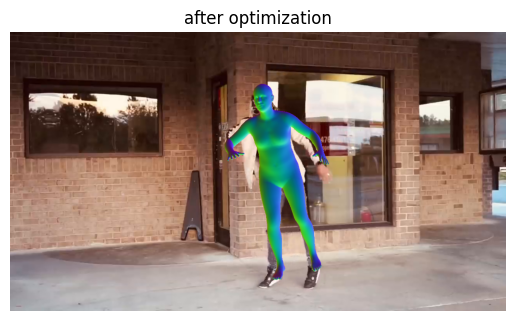

Iter: 249, J2D_Loss: 6572.4054, beta_reg: 0.0357, pose_prior: 2281.0842, angle_prior: 165.3278: 100%|██████████| 250/250 [00:03<00:00, 70.98it/s]


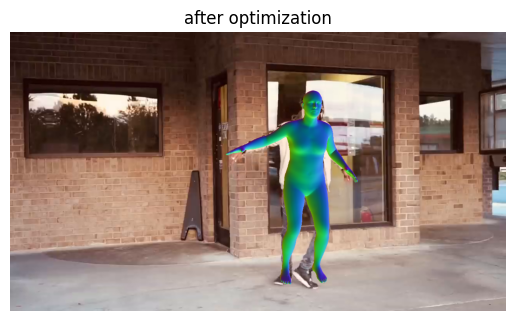

Iter: 249, J2D_Loss: 6043.8259, beta_reg: 0.1110, pose_prior: 2245.4692, angle_prior: 173.0972: 100%|██████████| 250/250 [00:03<00:00, 70.50it/s]


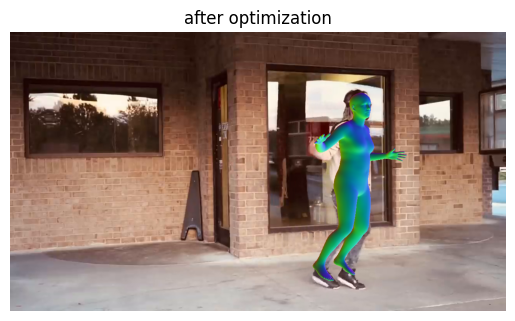

Iter: 249, J2D_Loss: 6642.8275, beta_reg: 0.1179, pose_prior: 2179.8413, angle_prior: 233.8311: 100%|██████████| 250/250 [00:03<00:00, 70.44it/s]


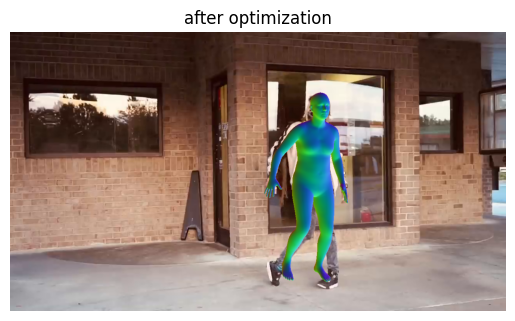

Iter: 249, J2D_Loss: 7598.3133, beta_reg: 0.0154, pose_prior: 2154.4314, angle_prior: 198.1258: 100%|██████████| 250/250 [00:03<00:00, 70.78it/s]


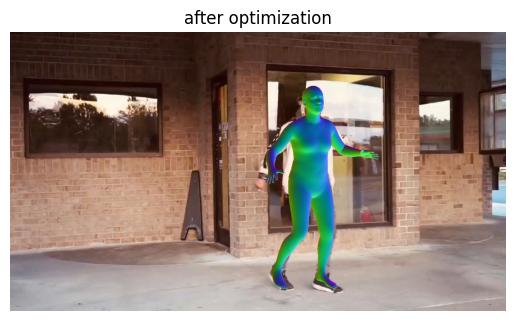

Iter: 249, J2D_Loss: 7261.5589, beta_reg: 0.0479, pose_prior: 2314.7603, angle_prior: 294.6238: 100%|██████████| 250/250 [00:03<00:00, 70.78it/s]


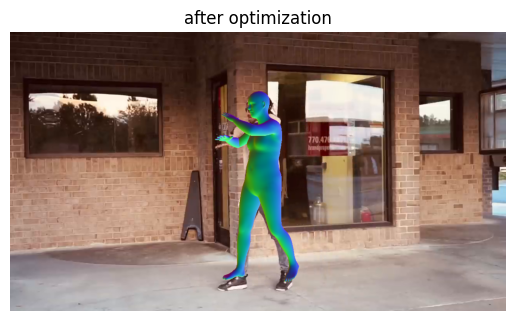

In [102]:
LR=1e-3
OPT_NUM_ITERS=250
for i in range(20):
    image = cv2.imread(str(img_fnames[i]))[...,[2,1,0]]

    smpl_param = np.load("ROMP/"+img_fnames[i].name[:-4] + ".npz", allow_pickle=True)['results'][()]
    optimize_kpts(image, poses[i], smpl_param)